<a href="https://colab.research.google.com/github/busha98/univ/blob/master/dashApps.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
            },
          });
        </script>
        '''))

In [3]:
import pandas as pd
from datetime import datetime, date, time, timedelta
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [20, 10]

import numpy as np

# import plotly 
# plotly.tools.set_credentials_file(username='shaleynikov', api_key='gDSlUrRtGjD3YlgMuz4j')
# plotly.tools.set_credentials_file(username='bushuev.artem98', api_key='V65FwNHM3lCp7QTpZpS9')


from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

# import plotly.offline as py
import plotly.graph_objs as go

init_notebook_mode(connected=True)

# TODO:

1. For months June, july, aug, sep, oct, nov 2018 (+)
2. Calculate days for 1.0, 1.5. Calculate value on 7, 14, 30, 60, 90 (+)
3. Same graph, but exclude trial without payments (+)
4. Same graph but for countries (US, UK, CA) (+)


----

1. Retention distribution
2. Conversion distribution

Conversion over time


# Functions definition

In [0]:
# points = [[days],[values]]

def calc_points(start_date, end_date, df, events):
  counter = 0
  points = [[],[]]
  cohort = df[(df['original_start_date'] >= start_date) & (df['original_start_date'] < end_date)]
  cohort_size = cohort[cohort['event'] == 'Start Introductory Price']['quantity'].sum()
  
  for time_range, group in cohort[cohort['event'].isin(events)].groupby('time_range'):
    counter += group['quantity'].sum() / cohort_size
    points[0].append(time_range.days)
    points[1].append(counter)
  return points

def plot(points):
  fig, axs = plt.subplots()
  axs.plot(points[0], points[1])
  plt.xticks(rotation='vertical')
  axs.grid(True)
  plt.show()
  
def getPointByDay(points, day):
  for i in range(len(points[0])):
    if points[0][i] >= day:
      return [points[0][i], points[1][i]]
  return [[day], [0]]
    
def getPointByValue(points, value):
    for i in range(len(points[0])):
      if points[1][i] >= value:
        return [points[0][i], points[1][i]]
    return [['not exist'], ['not exist']]

# Read from BigQuery

In [5]:
from google.colab import auth
auth.authenticate_user()
print('Authenticated')

Authenticated


In [6]:
%%bigquery --project dashappsanalytics df
  select * from `dashappsanalytics.app_store.SUBSCRIPTION_EVENT` ;


,event_date,event,app_name,app_apple_id,subscription_name,subscription_apple_id,subscription_group_id,subscription_duration,introductory_price_type,introductory_price_duration,...,client,device,state,country,previous_subscription_name,previous_subscription_apple_id,days_before_canceling,cancellation_reason,days_canceled,quantity
0,2019-04-14,Renew,U Beats: Beat Maker & Drum Pad,1238153568,Month subscription with 7 days trial,1262732920,20403689,1 Month,None,None,...,None,iPhone,兵庫県,JPN,None,None,None,None,None,1
1,2019-04-14,Renew,U Beats: Beat Maker & Drum Pad,1238153568,Month subscription,1262734122,20403689,1 Month,None,None,...,None,iPhone,NJ,USA,None,None,None,None,None,1
2,2019-04-14,Renew,U Beats: Beat Maker & Drum Pad,1238153568,Year subscription,1262735182,20403689,1 Year,None,None,...,None,iPhone,NSW,AUS,None,None,None,None,None,1
3,2019-04-14,Billing Retry from Paid Subscription,U Beats: Beat Maker & Drum Pad,1238153568,Year subscription,1262735182,20403689,1 Year,None,None,...,None,iPhone,RJ,BRA,None,None,None,None,None,1
4,2019-04-14,Billing Retry from Paid Subscription,U Beats: Beat Maker & Drum Pad,1238153568,Year subscription,1262735182,20403689,1 Year,None,None,...,None,iPhone,GA,USA,None,None,None,None,None,1
5,2019-04-14,Cancel,U Beats: Beat Maker & Drum Pad,1238153568,Year subscription,1262735182,20403689,1 Year,None,None,...,None,iPhone,None,GBR,None,None,323,Canceled,None,1
6,2019-04-14,Renewal from Billing Retry,Piano keyboard - music maker,1276147378,Month subscription,1293321244,20414142,1 Month,None,None,...,None,iPhone,None,GBR,None,None,None,None,None,1
7,2019-04-14,Billing Retry from Paid Subscription,Piano keyboard - music maker,1276147378,Month subscription,1293321244,20414142,1 Month,None,None,...,None,iPhone,None,UKR,None,None,None,None,None,1
8,2019-04-14,Renew,Piano keyboard - music maker,1276147378,Year subscription,1293323351,20414142,1 Year,None,None,...,None,iPad,LIM,PER,None,None,None,None,None,1
9,2019-04-14,Billing Retry from Paid Subscription,Piano keyboard - music maker,1276147378,Month subscription with 7 days trial,1293327412,20414142,1 Month,None,None,...,None,iPhone,AZ,USA,None,None,None,None,None,1


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 215430 entries, 0 to 215429
Data columns (total 26 columns):
event_date                        215430 non-null object
event                             215430 non-null object
app_name                          215430 non-null object
app_apple_id                      215430 non-null object
subscription_name                 215430 non-null object
subscription_apple_id             215430 non-null object
subscription_group_id             215430 non-null object
subscription_duration             215430 non-null object
introductory_price_type           78410 non-null object
introductory_price_duration       78410 non-null object
marketing_opt_in                  0 non-null object
marketing_opt_in_duration         0 non-null object
preserved_pricing                 85 non-null object
proceeds_reason                   221 non-null object
consecutive_paid_periods          215430 non-null object
original_start_date               215430 non-null obj

# Data preparation

In [0]:
def data_preparation(df):

  #df[df['app_apple_id'].isin([ubeats_app_id])]

  df['event_date'] = pd.to_datetime(df['event_date'])
  df['original_start_date'] = pd.to_datetime(df['original_start_date'])
  df['time_range'] = df['event_date'] - df['original_start_date']
  return df

In [0]:
ubeats_app_id = '1238153568'
mmm_app_id = '1355347116'
piano_app_id= '1276147378'

In [0]:

df = data_preparation(df)

In [11]:
df.head().T

,0,1,2,3,4
event_date,2019-04-14 00:00:00,2019-04-14 00:00:00,2019-04-14 00:00:00,2019-04-14 00:00:00,2019-04-14 00:00:00
event,Renew,Renew,Renew,Billing Retry from Paid Subscription,Billing Retry from Paid Subscription
app_name,U Beats: Beat Maker & Drum Pad,U Beats: Beat Maker & Drum Pad,U Beats: Beat Maker & Drum Pad,U Beats: Beat Maker & Drum Pad,U Beats: Beat Maker & Drum Pad
app_apple_id,1238153568,1238153568,1238153568,1238153568,1238153568
subscription_name,Month subscription with 7 days trial,Month subscription,Year subscription,Year subscription,Year subscription
subscription_apple_id,1262732920,1262734122,1262735182,1262735182,1262735182
subscription_group_id,20403689,20403689,20403689,20403689,20403689
subscription_duration,1 Month,1 Month,1 Year,1 Year,1 Year
introductory_price_type,None,None,None,None,None
introductory_price_duration,None,None,None,None,None


In [12]:
# Events
list(map(lambda x: x[0], df.groupby('event')))

['Billing Retry from Introductory Offer',
 'Billing Retry from Introductory Price',
 'Billing Retry from Paid Subscription',
 'Cancel',
 'Cancelled from Billing Retry',
 'Crossgrade',
 'Crossgrade from Billing Retry',
 'Crossgrade from Introductory Offer',
 'Crossgrade from Introductory Price',
 'Introductory Price Crossgrade from Billing Retry',
 'Introductory Price from Introductory Price',
 'Paid Subscription from Introductory Offer',
 'Paid Subscription from Introductory Price',
 'Reactivate',
 'Reactivate with Crossgrade',
 'Reactivate with Introductory Price',
 'Refund',
 'Renew',
 'Renewal from Billing Retry',
 'Start Introductory Offer',
 'Start Introductory Price',
 'Subscribe']

In [13]:
df[df['event'] == 'Subscribe'].head(50)

,event_date,event,app_name,app_apple_id,subscription_name,subscription_apple_id,subscription_group_id,subscription_duration,introductory_price_type,introductory_price_duration,...,device,state,country,previous_subscription_name,previous_subscription_apple_id,days_before_canceling,cancellation_reason,days_canceled,quantity,time_range
544,2019-04-14,Subscribe,U Beats: Beat Maker & Drum Pad,1238153568,Year subscription new,1376766115,20450526,1 Year,None,None,...,iPhone,CO,USA,None,None,None,None,None,1,0 days
590,2019-04-17,Subscribe,U Beats: Beat Maker & Drum Pad,1238153568,Year subscription new,1376766115,20450526,1 Year,None,None,...,iPhone,None,CHE,None,None,None,None,None,1,0 days
592,2019-04-17,Subscribe,U Beats: Beat Maker & Drum Pad,1238153568,Month subscription new,1376763885,20450526,1 Month,None,None,...,iPhone,CA,USA,None,None,None,None,None,1,0 days
1196,2019-04-15,Subscribe,U Beats: Beat Maker & Drum Pad,1238153568,Month subscription new,1376763885,20450526,1 Month,None,None,...,iPad,None,GBR,None,None,None,None,None,1,0 days
2915,2019-04-20,Subscribe,U Beats: Beat Maker & Drum Pad,1238153568,Year subscription new,1376766115,20450526,1 Year,None,None,...,iPad,None,BEL,None,None,None,None,None,1,0 days
2916,2019-04-20,Subscribe,U Beats: Beat Maker & Drum Pad,1238153568,Year subscription new,1376766115,20450526,1 Year,None,None,...,iPhone,FL,USA,None,None,None,None,None,1,0 days
3404,2019-04-18,Subscribe,U Beats: Beat Maker & Drum Pad,1238153568,Year subscription new,1376766115,20450526,1 Year,None,None,...,iPhone,FL,USA,None,None,None,None,None,1,0 days
5477,2018-03-10,Subscribe,U Beats - Dj Music Mixer,1238153568,Month subscription,1262734122,20403689,1 Month,None,None,...,iPad,None,GBR,None,None,None,None,None,1,0 days
5478,2018-04-01,Subscribe,U Beats - Dj Music Mixer,1238153568,Month subscription,1262734122,20403689,1 Month,None,None,...,iPad,CA,USA,None,None,None,None,None,1,0 days
5479,2018-03-30,Subscribe,U Beats - Dj Music Mixer,1238153568,Month subscription,1262734122,20403689,1 Month,None,None,...,iPad,MO,USA,None,None,None,None,None,1,0 days


# Graph by month

In [0]:
start_date = datetime(2018, 2, 9)
end_date = datetime(2019, 2, 9)

events = [
#  'Billing Retry from Introductory Offer',
#  'Billing Retry from Introductory Price',
#  'Billing Retry from Paid Subscription',
#  'Cancel',
#  'Cancelled from Billing Retry',
#  'Crossgrade',
#  'Crossgrade from Billing Retry',
#  'Crossgrade from Introductory Price',
#  'Introductory Price Crossgrade from Billing Retry',
#  'Introductory Price from Introductory Price',
#  'Paid Subscription from Introductory Offer',
 'Paid Subscription from Introductory Price',
 'Reactivate',
 'Reactivate with Crossgrade',
#  'Reactivate with Introductory Price',
#  'Refund',
 'Renew',
 'Renewal from Billing Retry',
#  'Start Introductory Offer',
#  'Start Introductory Price',
#  'Subscribe'
]

In [15]:
points = calc_points(datetime(2018, 3, 1), datetime(2019, 3, 1), df, events)
print(points)


[[0, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 2

In [0]:
# plot(points)

In [0]:
configure_plotly_browser_state()

data = [go.Scatter(x = points[0], y = points[1])]

fig = go.Figure(data=data)
iplot(fig)

In [0]:
def print_stats(points, label):
  print(label)
  print('\t day for 1.0 = ', getPointByValue(points, 1.0)[0])
  print('\t day for 1.5 = ', getPointByValue(points, 1.5)[0])
  print('\t value on 7 =', getPointByDay(points, 7)[1])
  print('\t value on 14 =', getPointByDay(points, 14)[1])
  print('\t value on 30 =', getPointByDay(points, 30)[1])
  print('\t value on 60 =', getPointByDay(points, 60)[1])
  print('\t value on 90 =', getPointByDay(points, 90)[1])

## Ubeats

In [0]:
ubeats = df[df['app_apple_id']== ubeats_app_id]

june_points = calc_points(datetime(2018, 6, 1), datetime(2018, 7, 1), ubeats, events)
july_points = calc_points(datetime(2018, 7, 1), datetime(2018, 8, 1), ubeats, events)
aug_points = calc_points(datetime(2018, 8, 1), datetime(2018, 9, 1), ubeats, events)
sep_points = calc_points(datetime(2018, 9, 1), datetime(2018, 10, 1), ubeats, events)
oct_points = calc_points(datetime(2018, 10, 1), datetime(2018, 11, 1), ubeats, events)
nov_points = calc_points(datetime(2018, 11, 1), datetime(2018, 12, 1), ubeats, events)
dec_points = calc_points(datetime(2018, 12, 1), datetime(2019, 1, 1), ubeats, events)
jan_points = calc_points(datetime(2019, 1, 1), datetime(2019, 2, 1), ubeats, events)
feb_points = calc_points(datetime(2019, 2, 1), datetime(2019, 3, 1), ubeats, events)
mar_points = calc_points(datetime(2019, 3, 1), datetime(2019, 4, 1), ubeats, events)

data = [
  go.Scatter(x = june_points[0], y = june_points[1], name='June'),
  go.Scatter(x = july_points[0], y = july_points[1], name='July'),
  go.Scatter(x = aug_points[0], y = aug_points[1], name='Aug'),
  go.Scatter(x = sep_points[0], y = sep_points[1], name='Sept'),
  go.Scatter(x = oct_points[0], y = oct_points[1], name='Oct'),
  go.Scatter(x = nov_points[0], y = nov_points[1], name='Nov'),
  go.Scatter(x = dec_points[0], y = dec_points[1], name='Dec'),
  go.Scatter(x = jan_points[0], y = jan_points[1], name='Jan'),
  go.Scatter(x = feb_points[0], y = feb_points[1], name='Feb'),
  go.Scatter(x = mar_points[0], y = mar_points[1], name='Mar'),
    
]

layout = go.Layout(title='Ubeats')
fig = go.Figure(data=data, layout=layout)

configure_plotly_browser_state()
iplot(fig, filename='Ubeats-evts-by-month')


In [0]:
print('Ubeats\n')
print_stats(june_points, 'June')
print_stats(july_points, 'July')
print_stats(aug_points, 'Aug')
print_stats(sep_points, 'Sep')
print_stats(oct_points, 'Oct')
print_stats(nov_points, 'Nov')

Ubeats

June
	 day for 1.0 =  39
	 day for 1.5 =  82
	 value on 7 = 0.3039824625502374862988673730
	 value on 14 = 0.4994519546949214468396054073
	 value on 30 = 0.8092802338326635001826817681
	 value on 60 = 1.286810376324442820606503468
	 value on 90 = 1.569967117281695286810376317
July
	 day for 1.0 =  34
	 day for 1.5 =  70
	 value on 7 = 0.3321370309951060358890701469
	 value on 14 = 0.5487765089722675367047308321
	 value on 30 = 0.8884176182707993474714518761
	 value on 60 = 1.396084828711256117455138664
	 value on 90 = 1.706362153344208809135399676
Aug
	 day for 1.0 =  38
	 day for 1.5 =  74
	 value on 7 = 0.3257690368129097327281896117
	 value on 14 = 0.5287443267776096822995461423
	 value on 30 = 0.8474533535047907211296016138
	 value on 60 = 1.348714069591527987897125570
	 value on 90 = 1.645234493192133131618759458
Sep
	 day for 1.0 =  45
	 day for 1.5 =  97
	 value on 7 = 0.2941783649876135425268373245
	 value on 14 = 0.4789430222956234516928158548
	 value on 30 = 0.7658959

In [0]:
# ubeats = df[df['app_apple_id']== ubeats_app_id]

# june_points = calc_points(datetime(2018, 6, 1), datetime(2018, 7, 1), ubeats, events)
# july_points = calc_points(datetime(2018, 7, 1), datetime(2018, 8, 1), ubeats, events)
# aug_points = calc_points(datetime(2018, 8, 1), datetime(2018, 9, 1), ubeats, events)
# sep_points = calc_points(datetime(2018, 9, 1), datetime(2018, 10, 1), ubeats, events)
# oct_points = calc_points(datetime(2018, 10, 1), datetime(2018, 11, 1), ubeats, events)
# nov_points = calc_points(datetime(2018, 11, 1), datetime(2018, 12, 1), ubeats, events)
# dec_points = calc_points(datetime(2018, 12, 1), datetime(2019, 1, 1), ubeats, events)
# jan_points = calc_points(datetime(2019, 1, 1), datetime(2019, 2, 1), ubeats, events)
# feb_points = calc_points(datetime(2019, 2, 1), datetime(2019, 3, 1), ubeats, events)
# mar_points = calc_points(datetime(2019, 3, 1), datetime(2019, 4, 1), ubeats, events)

# fig, axs = plt.subplots()
# axs.plot(june_points[0], june_points[1], label='june')
# axs.plot(july_points[0], july_points[1], label='july')
# axs.plot(aug_points[0], aug_points[1], label='aug')
# axs.plot(sep_points[0], sep_points[1], label='sep')
# axs.plot(oct_points[0], oct_points[1], label='oct')
# axs.plot(nov_points[0], nov_points[1], label='nov')
# axs.plot(dec_points[0], dec_points[1], label='dec')
# axs.plot(jan_points[0], jan_points[1], label='jan')
# axs.plot(feb_points[0], feb_points[1], label='feb')
# axs.plot(mar_points[0], mar_points[1], label='mar')

# axs.legend(loc="upper right")

# plt.xticks(rotation='vertical')
# axs.grid(True)
# plt.show()





## MMM

In [0]:
mmm = df[df['app_apple_id']== mmm_app_id]

june_points = calc_points(datetime(2018, 6, 1), datetime(2018, 7, 1), mmm, events)
july_points = calc_points(datetime(2018, 7, 1), datetime(2018, 8, 1), mmm, events)
aug_points = calc_points(datetime(2018, 8, 1), datetime(2018, 9, 1), mmm, events)
sep_points = calc_points(datetime(2018, 9, 1), datetime(2018, 10, 1), mmm, events)
oct_points = calc_points(datetime(2018, 10, 1), datetime(2018, 11, 1), mmm, events)
nov_points = calc_points(datetime(2018, 11, 1), datetime(2018, 12, 1), mmm, events)
dec_points = calc_points(datetime(2018, 12, 1), datetime(2019, 1, 1), mmm, events)
jan_points = calc_points(datetime(2019, 1, 1), datetime(2019, 2, 1), mmm, events)
feb_points = calc_points(datetime(2019, 2, 1), datetime(2019, 3, 1), mmm, events)
mar_points = calc_points(datetime(2019, 3, 1), datetime(2019, 4, 1), mmm, events)
# apr_points = calc_points(datetime(2019, 4, 1), datetime(2019, 5, 1), mmm, events)
# apr_points = calc_points(datetime(2019, 4, 1), datetime(2019, 4, 15), mmm, events)

data = [
  go.Scatter(x = june_points[0], y = june_points[1], name='June'),
  go.Scatter(x = july_points[0], y = july_points[1], name='July'),
  go.Scatter(x = aug_points[0], y = aug_points[1], name='Aug'),
  go.Scatter(x = sep_points[0], y = sep_points[1], name='Sept'),
  go.Scatter(x = oct_points[0], y = oct_points[1], name='Oct'),
  go.Scatter(x = nov_points[0], y = nov_points[1], name='Nov'),
  go.Scatter(x = dec_points[0], y = dec_points[1], name='Dec'),
  go.Scatter(x = jan_points[0], y = jan_points[1], name='Jan'),
  go.Scatter(x = feb_points[0], y = feb_points[1], name='Feb'),
  go.Scatter(x = mar_points[0], y = mar_points[1], name='Mar'),
#   go.Scatter(x = apr_points[0], y = apr_points[1], name='Apr'),
    
]

layout = go.Layout(title='MMM')
fig = go.Figure(data=data, layout=layout)

configure_plotly_browser_state()
iplot(fig, filename='mmm-evts-by-month')

In [0]:
print('MMM\n')
print_stats(june_points, 'June')
print_stats(july_points, 'July')
print_stats(aug_points, 'Aug')
print_stats(sep_points, 'Sep')
print_stats(oct_points, 'Oct')
print_stats(nov_points, 'Nov')

MMM

June
	 day for 1.0 =  49
	 day for 1.5 =  101
	 value on 7 = 0.2525458248472505091649694501
	 value on 14 = 0.4348268839103869653767820775
	 value on 30 = 0.7250509164969450101832993891
	 value on 60 = 1.145621181262729124236252544
	 value on 90 = 1.412423625254582484725050908
July
	 day for 1.0 =  60
	 day for 1.5 =  160
	 value on 7 = 0.2579852579852579852579852581
	 value on 14 = 0.4127764127764127764127764128
	 value on 30 = 0.6351351351351351351351351351
	 value on 60 = 1.002457002457002457002457003
	 value on 90 = 1.201474201474201474201474201
Aug
	 day for 1.0 =  73
	 day for 1.5 =  213
	 value on 7 = 0.2489795918367346938775510204
	 value on 14 = 0.4000000000000000000000000000
	 value on 30 = 0.7061224489795918367346938775
	 value on 60 = 0.9346938775510204081632653061
	 value on 90 = 1.130612244897959183673469388
Sep
	 day for 1.0 =  70
	 day for 1.5 =  178
	 value on 7 = 0.2373887240356083086053412464
	 value on 14 = 0.5133531157270029673590504452
	 value on 30 = 0.70326

In [0]:
# def print_stats(points, label):
#   print(label)
#   print('\t day for 1.0 = ', getPointByValue(points, 1.0)[0])
#   print('\t day for 1.5 = ', getPointByValue(points, 1.5)[0])
#   print('\t value on 7 =', getPointByDay(points, 7)[1])
#   print('\t value on 14 =', getPointByDay(points, 14)[1])
#   print('\t value on 30 =', getPointByDay(points, 30)[1])
#   print('\t value on 60 =', getPointByDay(points, 60)[1])
#   print('\t value on 90 =', getPointByDay(points, 90)[1])


# fig, axs = plt.subplots(nrows=3, ncols=2)
# axs = axs.flatten()

# axs[0].plot(june_points[0], june_points[1])
# axs[0].set_title('june')


# axs[1].plot(july_points[0], july_points[1])
# axs[1].set_title('july')


# axs[2].plot(aug_points[0], aug_points[1])
# axs[2].set_title('aug')


# axs[3].plot(sep_points[0], sep_points[1])
# axs[3].set_title('sep')


# axs[4].plot(oct_points[0], oct_points[1])
# axs[4].set_title('oct')


# axs[5].plot(nov_points[0], nov_points[1])
# axs[5].set_title('nov')


# fig.tight_layout()
# plt.show()

# print_stats(june_points, 'June')
# print_stats(july_points, 'July')
# print_stats(aug_points, 'Aug')
# print_stats(sep_points, 'Sep')
# print_stats(oct_points, 'Oct')
# print_stats(nov_points, 'Nov')

# Events anomality

In [0]:
list(map(lambda x: x[0], df.groupby('event')))

['Billing Retry from Introductory Offer',
 'Billing Retry from Introductory Price',
 'Billing Retry from Paid Subscription',
 'Cancel',
 'Cancelled from Billing Retry',
 'Crossgrade',
 'Crossgrade from Billing Retry',
 'Crossgrade from Introductory Offer',
 'Crossgrade from Introductory Price',
 'Introductory Price Crossgrade from Billing Retry',
 'Introductory Price from Introductory Price',
 'Paid Subscription from Introductory Offer',
 'Paid Subscription from Introductory Price',
 'Reactivate',
 'Reactivate with Crossgrade',
 'Reactivate with Introductory Price',
 'Refund',
 'Renew',
 'Renewal from Billing Retry',
 'Start Introductory Offer',
 'Start Introductory Price',
 'Subscribe']

In [0]:
event_name = 'Introductory Price from Introductory Price'
df[df['event'] == event_name]

,event_date,event,app_name,app_apple_id,subscription_name,subscription_apple_id,subscription_group_id,subscription_duration,introductory_price_type,introductory_price_duration,...,device,state,country,previous_subscription_name,previous_subscription_apple_id,days_before_canceling,cancellation_reason,days_canceled,quantity,time_range
10927,2018-04-06,Introductory Price from Introductory Price,U Beats - Dj Music Mixer,1238153568,Week subscription with 7 days trial,1342643870,20403689,7 Days,Free Trial,3 Days,...,iPhone,None,GBR,None,None,None,None,None,1,0 days
10928,2018-04-18,Introductory Price from Introductory Price,U Beats: Beat Maker & Drum Pad,1238153568,Week subscription with 7 days trial,1342643870,20403689,7 Days,Free Trial,3 Days,...,iPhone,SA,AUS,None,None,None,None,None,1,0 days
10929,2018-05-04,Introductory Price from Introductory Price,U Beats: Beat Maker & Drum Pad,1238153568,Week subscription with 7 days trial,1342643870,20403689,7 Days,Free Trial,3 Days,...,iPhone,None,AUT,None,None,None,None,None,1,0 days
10930,2018-04-18,Introductory Price from Introductory Price,U Beats: Beat Maker & Drum Pad,1238153568,Week subscription with 7 days trial,1342643870,20403689,7 Days,Free Trial,3 Days,...,iPhone,None,GBR,None,None,None,None,None,1,0 days
10931,2018-04-23,Introductory Price from Introductory Price,U Beats: Beat Maker & Drum Pad,1238153568,Week subscription with 7 days trial,1342643870,20403689,7 Days,Free Trial,3 Days,...,iPhone,None,NOR,None,None,None,None,None,1,1 days
10932,2019-02-15,Introductory Price from Introductory Price,U Beats: Beat Maker & Drum Pad,1238153568,Week subscription with 3 days trial by 3.99,1342643870,20403689,7 Days,Free Trial,3 Days,...,iPad,GA,USA,None,None,None,None,None,1,0 days
29058,2019-02-15,Introductory Price from Introductory Price,U Beats: Beat Maker & Drum Pad,1238153568,Week subscription with 3 days trial,1362026259,20403689,7 Days,Free Trial,3 Days,...,iPad,GA,USA,None,None,None,None,None,1,0 days
192225,2019-01-11,Introductory Price from Introductory Price,U Beats: Beat Maker & Drum Pad,1238153568,Weekly subscription with 3-day trial,1376753465,20450526,7 Days,Free Trial,3 Days,...,iPad,QLD,AUS,None,None,None,None,None,1,0 days
192226,2019-01-08,Introductory Price from Introductory Price,U Beats: Beat Maker & Drum Pad,1238153568,Weekly subscription with 3-day trial,1376753465,20450526,7 Days,Free Trial,3 Days,...,iPad,BC,CAN,None,None,None,None,None,1,0 days
192227,2019-01-12,Introductory Price from Introductory Price,U Beats: Beat Maker & Drum Pad,1238153568,Weekly subscription with 3-day trial,1376753465,20450526,7 Days,Free Trial,3 Days,...,iPad,Z,ESP,None,None,None,None,None,1,0 days


In [0]:
start_date = datetime(2019, 3, 1)
end_date = datetime(2019, 4, 1)
cohort = df[(df['original_start_date'] >= start_date) & (df['original_start_date'] < end_date)]
cohort_size = cohort[cohort['event'] == 'Start Introductory Price']['quantity'].sum()

In [0]:
# cohort

# Graph with exclude trial without payments

In [0]:
def calc_points_paid_only(start_date, end_date, df, events):
  counter = 0
  points = [[],[]]
  cohort = df[(df['original_start_date'] >= start_date) & (df['original_start_date'] < end_date)]
  cohort_size = cohort[(cohort['consecutive_paid_periods'] == 1) & (cohort['event'].isin(events))]['quantity'].sum()
    
  for time_range, group in cohort[cohort['event'].isin(events)].groupby('time_range'):
    counter += group['quantity'].sum() / cohort_size
    points[0].append(time_range.days)
    points[1].append(counter)
  return points


In [0]:
list(map(lambda x: x[0], df[df['consecutive_paid_periods'] == 0].groupby('event')))

['Billing Retry from Introductory Offer',
 'Billing Retry from Introductory Price',
 'Cancel',
 'Cancelled from Billing Retry',
 'Crossgrade',
 'Crossgrade from Introductory Price',
 'Introductory Price from Introductory Price',
 'Refund',
 'Start Introductory Offer',
 'Start Introductory Price']

In [0]:
list(map(lambda x: x[0], df[df['consecutive_paid_periods'] == 1].groupby('event')))

['Billing Retry from Introductory Price',
 'Billing Retry from Paid Subscription',
 'Cancel',
 'Cancelled from Billing Retry',
 'Crossgrade',
 'Crossgrade from Billing Retry',
 'Crossgrade from Introductory Offer',
 'Crossgrade from Introductory Price',
 'Introductory Price Crossgrade from Billing Retry',
 'Paid Subscription from Introductory Offer',
 'Paid Subscription from Introductory Price',
 'Reactivate',
 'Reactivate with Crossgrade',
 'Refund',
 'Renew',
 'Renewal from Billing Retry',
 'Subscribe']

In [0]:
print(df[(df['consecutive_paid_periods'] == 1) & (df['event'].isin(events))]['quantity'].sum())
# df[(df['consecutive_paid_periods'] == 1) & (df['event'].isin(events))].info()

18389


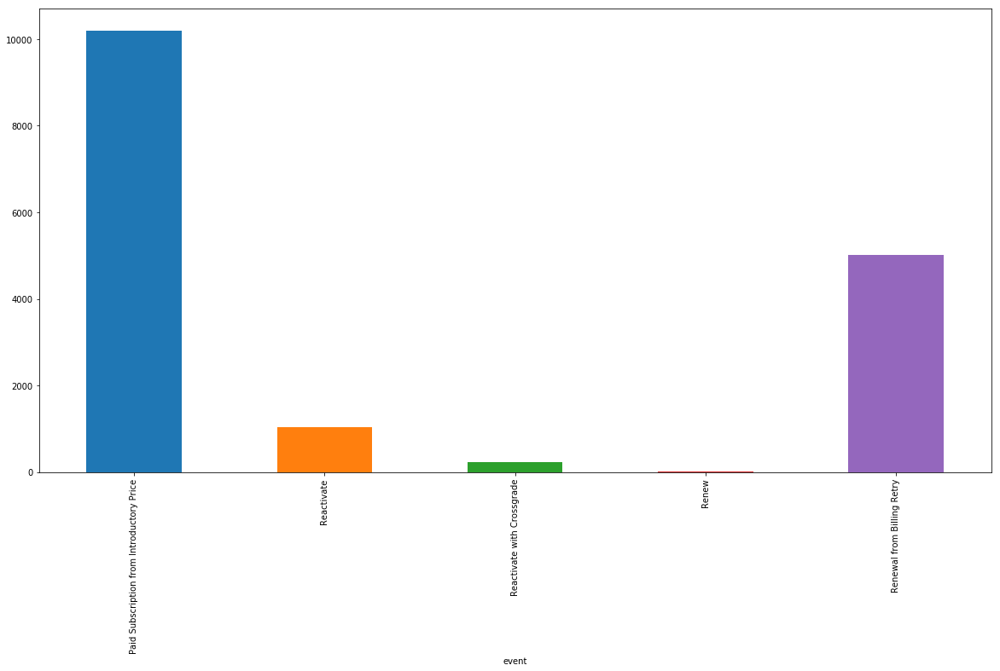

In [0]:
df[(df['consecutive_paid_periods'] == 1) & (df['event'].isin(events))].groupby('event').size().plot(kind='bar')


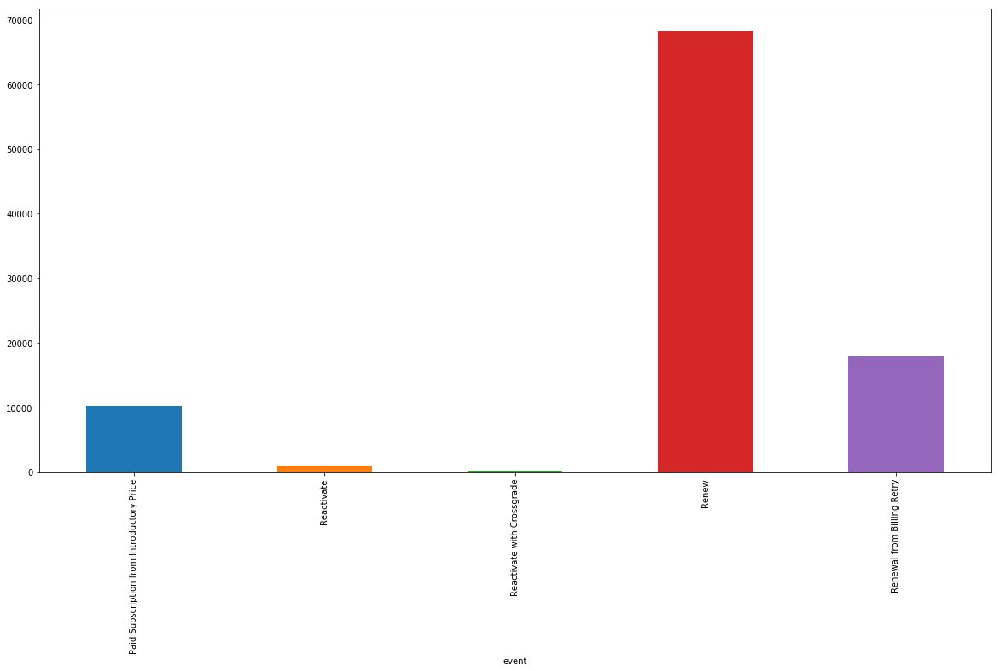

In [0]:
df[(df['event'].isin(events))].groupby('event')['quantity'].size().plot(kind='bar')


In [0]:
points_paid_only = calc_points_paid_only(
                    datetime(2018, 1, 1),
                    datetime(2019, 1, 1),
                    df,
                    events)

configure_plotly_browser_state()

data = [go.Scatter(x = points_paid_only[0], y = points_paid_only[1])]

fig = go.Figure(data=data)
iplot(fig)

## Ubeats

In [0]:
ubeats = df[df['app_apple_id']== ubeats_app_id]

june_points = calc_points_paid_only(datetime(2018, 6, 1), datetime(2018, 7, 1), ubeats, events)
july_points = calc_points_paid_only(datetime(2018, 7, 1), datetime(2018, 8, 1), ubeats, events)
aug_points = calc_points_paid_only(datetime(2018, 8, 1), datetime(2018, 9, 1), ubeats, events)
sep_points = calc_points_paid_only(datetime(2018, 9, 1), datetime(2018, 10, 1), ubeats, events)
oct_points = calc_points_paid_only(datetime(2018, 10, 1), datetime(2018, 11, 1), ubeats, events)
nov_points = calc_points_paid_only(datetime(2018, 11, 1), datetime(2018, 12, 1), ubeats, events)
dec_points = calc_points_paid_only(datetime(2018, 12, 1), datetime(2019, 1, 1), ubeats, events)
jan_points = calc_points_paid_only(datetime(2019, 1, 1), datetime(2019, 2, 1), ubeats, events)
feb_points = calc_points_paid_only(datetime(2019, 2, 1), datetime(2019, 3, 1), ubeats, events)
mar_points = calc_points_paid_only(datetime(2019, 3, 1), datetime(2019, 4, 1), ubeats, events)

data = [
  go.Scatter(x = june_points[0], y = june_points[1], name='June'),
  go.Scatter(x = july_points[0], y = july_points[1], name='July'),
  go.Scatter(x = aug_points[0], y = aug_points[1], name='Aug'),
  go.Scatter(x = sep_points[0], y = sep_points[1], name='Sept'),
  go.Scatter(x = oct_points[0], y = oct_points[1], name='Oct'),
  go.Scatter(x = nov_points[0], y = nov_points[1], name='Nov'),
  go.Scatter(x = dec_points[0], y = dec_points[1], name='Dec'),
  go.Scatter(x = jan_points[0], y = jan_points[1], name='Jan'),
  go.Scatter(x = feb_points[0], y = feb_points[1], name='Feb'),
  go.Scatter(x = mar_points[0], y = mar_points[1], name='Mar'),
    
]


layout = go.Layout(title='Ubeats paid')
fig = go.Figure(data=data, layout=layout)

configure_plotly_browser_state()
iplot(fig, filename='evts-by-month-paid')



## MMM

In [0]:
mmm = df[df['app_apple_id']== mmm_app_id]

june_points = calc_points_paid_only(datetime(2018, 6, 1), datetime(2018, 7, 1), mmm, events)
july_points = calc_points_paid_only(datetime(2018, 7, 1), datetime(2018, 8, 1), mmm, events)
aug_points = calc_points_paid_only(datetime(2018, 8, 1), datetime(2018, 9, 1), mmm, events)
sep_points = calc_points_paid_only(datetime(2018, 9, 1), datetime(2018, 10, 1), mmm, events)
oct_points = calc_points_paid_only(datetime(2018, 10, 1), datetime(2018, 11, 1), mmm, events)
nov_points = calc_points_paid_only(datetime(2018, 11, 1), datetime(2018, 12, 1), mmm, events)
dec_points = calc_points_paid_only(datetime(2018, 12, 1), datetime(2019, 1, 1), mmm, events)
jan_points = calc_points_paid_only(datetime(2019, 1, 1), datetime(2019, 2, 1), mmm, events)
feb_points = calc_points_paid_only(datetime(2019, 2, 1), datetime(2019, 3, 1), mmm, events)
mar_points = calc_points_paid_only(datetime(2019, 3, 1), datetime(2019, 4, 1), mmm, events)

data = [
  go.Scatter(x = june_points[0], y = june_points[1], name='June'),
  go.Scatter(x = july_points[0], y = july_points[1], name='July'),
  go.Scatter(x = aug_points[0], y = aug_points[1], name='Aug'),
  go.Scatter(x = sep_points[0], y = sep_points[1], name='Sept'),
  go.Scatter(x = oct_points[0], y = oct_points[1], name='Oct'),
  go.Scatter(x = nov_points[0], y = nov_points[1], name='Nov'),
  go.Scatter(x = dec_points[0], y = dec_points[1], name='Dec'),
  go.Scatter(x = jan_points[0], y = jan_points[1], name='Jan'),
  go.Scatter(x = feb_points[0], y = feb_points[1], name='Feb'),
  go.Scatter(x = mar_points[0], y = mar_points[1], name='Mar'),
    
]

layout = go.Layout(title='MMM paid')
fig = go.Figure(data=data, layout=layout)

configure_plotly_browser_state()
iplot(fig, filename='mmm-evts-by-month-paid')

In [0]:
# for name, group in df[(df['consecutive_paid_periods'] == 1)].groupby('event'):
#    print(name)

# Graphs for countries

In [0]:
def plot_by_countries(start_data, end_data, df, events):
  data = []
  layout = go.Layout(title='Countries', showlegend=True)

  
  for name, group in df.groupby('country'):
    points = calc_points(start_data, end_data, group, events)
    data.append( go.Scatter(x = points[0], y = points[1], name=name, visible='legendonly'))

  fig = go.Figure(data=data, layout=layout)
  return iplot(fig)

 

In [0]:
configure_plotly_browser_state()
plot_by_countries(datetime(2018, 6, 1), datetime(2019, 3, 1), df, events)

In [0]:
def points_comparator(x):
  return -x[1]

points = list(map(lambda x: [x[0], x[1]['quantity'].sum()], df.groupby('country')))
points = sorted(points, key=points_comparator)

data = [go.Bar(
            x=list(map(lambda x: x[0], points)),
            y=list(map(lambda x: x[1], points))
    )]

configure_plotly_browser_state()
iplot(data)

## Ubeats

In [0]:
ubeats = df[df['app_apple_id']== ubeats_app_id]

points = list(map(lambda x: [x[0], x[1]['quantity'].sum()], ubeats.groupby('country')))
points = sorted(points, key=points_comparator)

data = [go.Bar(
            x=list(map(lambda x: x[0], points)),
            y=list(map(lambda x: x[1], points))
    )]

layout = go.Layout(title='events count per country')

configure_plotly_browser_state()
iplot(data, filename='events-count-per-country')

## MMM

In [0]:
mmm = df[df['app_apple_id']== mmm_app_id]

points = list(map(lambda x: [x[0], x[1]['quantity'].sum()], mmm.groupby('country')))
points = sorted(points, key=points_comparator)

data = [go.Bar(
            x=list(map(lambda x: x[0], points)),
            y=list(map(lambda x: x[1], points))
    )]

layout = go.Layout(title='events count per country')

configure_plotly_browser_state()
iplot(data, filename='events-count-per-country')

# Conversion distribution

## Ubeats

first payment distribution (histogram, box plot)

payments distribution (histogram)


In [21]:
ubeats = df[df['app_apple_id']== ubeats_app_id]

x = list(map(lambda x: x.days, ubeats[(ubeats['consecutive_paid_periods'] == 1) & (ubeats['event'].isin(events))]['time_range']))

data = [go.Histogram(x=x, xbins=dict(size=1))]
layout = go.Layout(title='Ubeats / first payment distribution')
fig = go.Figure(data=data, layout=layout)

configure_plotly_browser_state()
iplot(fig, filename='1')

In [22]:
# first payment distribution (box plot)

y = list(map(lambda x: x.days, ubeats[(ubeats['consecutive_paid_periods'] == 1) & (ubeats['event'].isin(events))]['time_range']))

print('7: ', len(list(filter(lambda x: x <= 7, y)))/ len(y))
print('1: ', len(list(filter(lambda x: x <= 1, y)))/ len(y))
print('30: ', len(list(filter(lambda x: x <= 30, y)))/ len(y))
print('3: ', len(list(filter(lambda x: x <= 3, y)))/ len(y))
print('upper fence: ', len(list(filter(lambda x: x <= 8, y)))/ len(y))


data = [go.Box(y=y)]
layout = go.Layout(title='Ubeats / first payment distribution')
fig = go.Figure(data=data, layout=layout)

configure_plotly_browser_state()
iplot(fig, filename='1')


7:  0.8031914893617021
1:  0.08153866113129217
30:  0.9376621691748832
3:  0.6909704203425013
upper fence:  0.8144135962636222


In [23]:
print(len(y)*0.95)
np.sort(y)[14559]

14645.199999999999


33

In [24]:
# payments distribution (histogram)

x = list(map(lambda x: x.days, ubeats[(ubeats['event'].isin(events))]['time_range']))
data = [go.Histogram(x=x, xbins=dict(size=1))]
layout = go.Layout(title='Ubeats / payments distribution')
fig = go.Figure(data=data, layout=layout)

configure_plotly_browser_state()
iplot(fig, filename='1')

## MMM

first payment distribution (histogram, box plot)

payments distribution (histogram)

In [0]:
# first payment distribution (hist)

mmm = df[df['app_apple_id']== mmm_app_id]

x = list(map(lambda x: x.days, mmm[(mmm['consecutive_paid_periods'] == 1) & (mmm['event'].isin(events))]['time_range']))

data = [go.Histogram(x=x, xbins=dict(size=1))]
layout = go.Layout(title='mmm / first payment distribution')
fig = go.Figure(data=data, layout=layout)

configure_plotly_browser_state()
iplot(fig, filename='1')

In [0]:
# first payment distribution (box plot)

y = list(map(lambda x: x.days, mmm[(mmm['consecutive_paid_periods'] == 1) & (mmm['event'].isin(events))]['time_range']))

print('upper fence: ', len(list(filter(lambda x: x < 6, y)))/ len(y), '\t29.03.19')


data = [go.Box(y=y)]
layout = go.Layout(title='mmm / first payment distribution')
fig = go.Figure(data=data, layout=layout)

configure_plotly_browser_state()
iplot(fig, filename='1')


upper fence:  0.7900900900900901 	29.03.19


In [0]:
# payments distribution (histogram)

x = list(map(lambda x: x.days, mmm[(mmm['event'].isin(events))]['time_range']))
data = [go.Histogram(x=x, xbins=dict(size=1))]
layout = go.Layout(title='mmm / payments distribution')
fig = go.Figure(data=data, layout=layout)

configure_plotly_browser_state()
iplot(fig, filename='1')

# corrcoef

In [0]:
def calc_coef(value, day):
  return value/day

def get_vector(points, days):
  vector = []
  for i in range(days):
    vector.append(calc_coef(getPointByDay(points, i)[1], i+1))
  return vector

In [0]:
june_points = calc_points(datetime(2018, 6, 1), datetime(2018, 7, 1), ubeats, events)
july_points = calc_points(datetime(2018, 7, 1), datetime(2018, 8, 1), ubeats, events)
aug_points = calc_points(datetime(2018, 8, 1), datetime(2018, 9, 1), ubeats, events)
sep_points = calc_points(datetime(2018, 9, 1), datetime(2018, 10, 1), ubeats, events)
oct_points = calc_points(datetime(2018, 10, 1), datetime(2018, 11, 1), ubeats, events)
nov_points = calc_points(datetime(2018, 11, 1), datetime(2018, 12, 1), ubeats, events)
dec_points = calc_points(datetime(2018, 12, 1), datetime(2019, 1, 1), ubeats, events)
jan_points = calc_points(datetime(2019, 1, 1), datetime(2019, 2, 1), ubeats, events)
feb_points = calc_points(datetime(2019, 2, 1), datetime(2019, 3, 1), ubeats, events)
mar_points = calc_points(datetime(2019, 3, 1), datetime(2019, 4, 1), ubeats, events)


In [0]:
array = np.array([
    get_vector(june_points, 25),
    get_vector(july_points, 25),
    get_vector(aug_points, 25),
    get_vector(sep_points, 25),
    get_vector(oct_points, 25),
    get_vector(nov_points, 25),
    get_vector(dec_points, 25),
    get_vector(jan_points, 25),
    get_vector(feb_points, 25),
    get_vector(mar_points, 25),
])


In [0]:
np.corrcoef(array.astype(float))

array([[ 1.        ,  0.99863619,  0.99874664,  0.99724527, -0.16306567,
         0.98534672,  0.98217539,  0.98391558,  0.97083333,  0.85860256],
       [ 0.99863619,  1.        ,  0.99986405,  0.99959195, -0.18166295,
         0.99241445,  0.99015288,  0.99129917,  0.98155479,  0.88363262],
       [ 0.99874664,  0.99986405,  1.        ,  0.99969196, -0.17315984,
         0.99258475,  0.99029647,  0.99152631,  0.98151567,  0.88233846],
       [ 0.99724527,  0.99959195,  0.99969196,  1.        , -0.18092505,
         0.99523191,  0.99337492,  0.99438047,  0.98586626,  0.8934021 ],
       [-0.16306567, -0.18166295, -0.17315984, -0.18092505,  1.        ,
        -0.19636435, -0.20203519, -0.20039232, -0.21604711, -0.29826234],
       [ 0.98534672,  0.99241445,  0.99258475,  0.99523191, -0.19636435,
         1.        ,  0.99980405,  0.99991923,  0.99738955,  0.93128826],
       [ 0.98217539,  0.99015288,  0.99029647,  0.99337492, -0.20203519,
         0.99980405,  1.        ,  0.9998475 

# User classification

In [0]:
for name, group in df.groupby('subscription_name'):
  print(name)

Month subscription
Month subscription new
Month subscription with 7 days trial
Week subscription with 3 days trial
Week subscription with 3 days trial by 0.99
Week subscription with 3 days trial by 3.99
Week subscription with 7 days trial
Week with 3 days trial
Week with 3 days trial by 2.99
Weekly subscription with 3-day trial
Weekly subscription with 3-day trial by 8.99
Year subscription
Year subscription new


In [0]:
df.head().T

,0,1,2,3,4
event_date,2018-03-19 00:00:00,2018-03-17 00:00:00,2018-04-03 00:00:00,2018-03-19 00:00:00,2018-03-09 00:00:00
event,Renew,Renew,Renew,Renew,Renew
app_name,U Beats - Dj Music Mixer,U Beats - Dj Music Mixer,U Beats - Dj Music Mixer,U Beats - Dj Music Mixer,U Beats - Dj Music Mixer
app_apple_id,1238153568,1238153568,1238153568,1238153568,1238153568
subscription_name,Month subscription with 7 days trial,Month subscription with 7 days trial,Month subscription with 7 days trial,Month subscription with 7 days trial,Month subscription with 7 days trial
subscription_apple_id,1262732920,1262732920,1262732920,1262732920,1262732920
subscription_group_id,20403689,20403689,20403689,20403689,20403689
subscription_duration,1 Month,1 Month,1 Month,1 Month,1 Month
introductory_price_type,None,None,None,None,None
introductory_price_duration,None,None,None,None,None


In [0]:
df[(df['consecutive_paid_periods'] == 1) & (df['event'].isin(events))]['quantity'].sum()

Decimal('18389')

In [0]:
df[(df['consecutive_paid_periods'] == 2) & (df['event'].isin(events))]['quantity'].sum()

Decimal('11827')

In [0]:
# Month subscription

# x = []
# y_month_subscription = []
# y_month subscription new = []
# y_month subscription with 7 days trial = []
# y_meek subscription with 3 days trial = []
# y_meek subscription with 3 days trial by 0.99 = []
# y_Week subscription with 3 days trial by 3.99 = []
# y_Week subscription with 7 days trial = []
# y_Week with 3 days trial = []
# y_Week with 3 days trial by 2.99 = []
# y_Weekly subscription with 3-day trial = []
# y_Weekly subscription with 3-day trial by 8.99 = []
# y_Year subscription = []
# y_Year subscription new = []

# for day, group in df[(df['event'].isin(events))].groupby('consecutive_paid_periods'):
#   x.append(day)
#   y.append(group['quantity'].sum())


# data = [go.Bar(x=x, y=y)]
# py.iplot(data, filename='1')

## histagrams

In [0]:
subscription_names = [
  'Month subscription',
  'Month subscription new',
  'Month subscription with 7 days trial',
  'Week subscription with 3 days trial',
  'Week subscription with 3 days trial by 0.99',
  'Week subscription with 3 days trial by 3.99',
  'Week subscription with 7 days trial',
  'Week with 3 days trial',
  'Week with 3 days trial by 2.99',
  'Weekly subscription with 3-day trial',
  'Weekly subscription with 3-day trial by 8.99',
  'Year subscription',
  'Year subscription new',
]

In [0]:
def get_points(df, start_date, end_date):
  group = df[(df['original_start_date'] >= start_date) & (df['original_start_date'] < end_date)]
  points = [[], []]
  
  for pay_period, data in group[(group['event'].isin(events))].groupby('consecutive_paid_periods'):
    points[0].append(pay_period)
    points[1].append(data['quantity'].sum())
  return points

def probability(points):
  result = [[], [], []]
  for i in range(1, len(points[0])):
    result[0].append(points[0][i])
    result[2].append(points[1][i])
    result[1].append(points[1][i] / points[1][i-1])
  return result

In [0]:
x = {}
y = {}
for name, group in df.groupby('subscription_name'):
  x[name] = []
  y[name] = []
  for pay_period, data in group[(group['event'].isin(events))].groupby('consecutive_paid_periods'):
    x[name].append(pay_period)
    y[name].append(data['quantity'].sum())

In [0]:
print(subscription_names[0])

Month subscription


In [0]:
def hist(title, _x, _y):
  print(title)
  data = [go.Bar(x=_x, y=_y)]
  layout = go.Layout(title=title)
  fig = go.Figure(data=data, layout=layout)
  return iplot(fig, filename='1')

In [0]:
configure_plotly_browser_state()
hist(subscription_names[0], x[subscription_names[0]], y[subscription_names[0]])

Month subscription


In [0]:
configure_plotly_browser_state()
hist(subscription_names[1], x[subscription_names[1]], y[subscription_names[1]])

Month subscription new


In [0]:
configure_plotly_browser_state()
hist(subscription_names[2], x[subscription_names[2]], y[subscription_names[2]])

Month subscription with 7 days trial


In [0]:
configure_plotly_browser_state()
hist(subscription_names[3], x[subscription_names[3]], y[subscription_names[3]])

Week subscription with 3 days trial


In [0]:
configure_plotly_browser_state()
hist(subscription_names[4], x[subscription_names[4]], y[subscription_names[4]])

Week subscription with 3 days trial by 0.99


In [0]:
configure_plotly_browser_state()
hist(subscription_names[5], x[subscription_names[5]], y[subscription_names[5]])

Week subscription with 3 days trial by 3.99


In [0]:
configure_plotly_browser_state()
hist(subscription_names[6], x[subscription_names[6]], y[subscription_names[6]])

Week subscription with 7 days trial


In [0]:
configure_plotly_browser_state()
hist(subscription_names[7], x[subscription_names[7]], y[subscription_names[7]])

Week with 3 days trial


In [0]:
configure_plotly_browser_state()
hist(subscription_names[8], x[subscription_names[8]], y[subscription_names[8]])

Week with 3 days trial by 2.99


In [0]:
configure_plotly_browser_state()
hist(subscription_names[9], x[subscription_names[9]], y[subscription_names[9]])

Weekly subscription with 3-day trial


In [0]:
configure_plotly_browser_state()
hist(subscription_names[10], x[subscription_names[10]], y[subscription_names[10]])

Weekly subscription with 3-day trial by 8.99


In [0]:
configure_plotly_browser_state()
hist(subscription_names[11], x[subscription_names[11]], y[subscription_names[11]])

Year subscription


In [0]:
configure_plotly_browser_state()
hist(subscription_names[12], x[subscription_names[12]], y[subscription_names[12]])

Year subscription new


## Week subscriptions

In [0]:
week_subscriptions = [
  'Week subscription with 3 days trial',
  'Week subscription with 3 days trial by 0.99',
  'Week subscription with 3 days trial by 3.99',
  'Week subscription with 7 days trial',
  'Week with 3 days trial',
  'Week with 3 days trial by 2.99',
  'Weekly subscription with 3-day trial',
  'Weekly subscription with 3-day trial by 8.99'
]

In [0]:
def get_points(df, start_date, end_date):
  group = df[(df['original_start_date'] >= start_date) & (df['original_start_date'] < end_date)]
  points = [[], []]
  
  for pay_period, data in group[(group['event'].isin(events)) & (group['subscription_name'].isin(week_subscriptions))].groupby('consecutive_paid_periods'):
    points[0].append(pay_period)
    points[1].append(data['quantity'].sum())
  return points

In [0]:
def probability(points):
  result = [[], [], []]
  for i in range(1, len(points[0])):
    result[0].append(points[0][i])
    result[2].append(points[1][i])
    result[1].append(points[1][i] / points[1][i-1])

  return result 

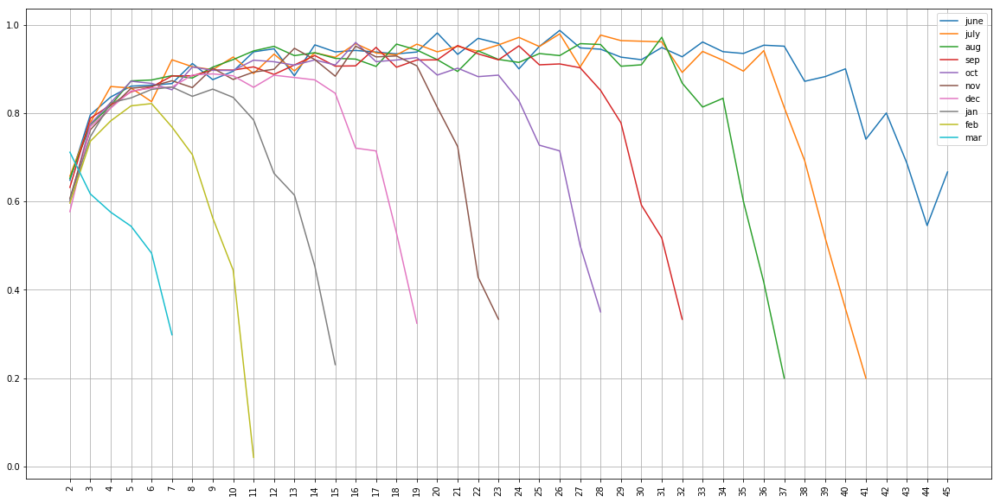

In [0]:
ubeats = df[df['app_apple_id']== ubeats_app_id]

june_points = probability(get_points(ubeats, datetime(2018, 6, 1), datetime(2018, 7, 1)))
july_points = probability(get_points(ubeats, datetime(2018, 7, 1), datetime(2018, 8, 1)))
aug_points = probability(get_points(ubeats, datetime(2018, 8, 1), datetime(2018, 9, 1)))
sep_points = probability(get_points(ubeats, datetime(2018, 9, 1), datetime(2018, 10, 1)))
oct_points = probability(get_points(ubeats, datetime(2018, 10, 1), datetime(2018, 11, 1)))
nov_points = probability(get_points(ubeats, datetime(2018, 11, 1), datetime(2018, 12, 1)))
dec_points = probability(get_points(ubeats, datetime(2018, 12, 1), datetime(2019, 1, 1)))
jan_points = probability(get_points(ubeats, datetime(2019, 1, 1), datetime(2019, 2, 1)))
feb_points = probability(get_points(ubeats, datetime(2019, 2, 1), datetime(2019, 3, 1)))
mar_points = probability(get_points(ubeats, datetime(2019, 3, 1), datetime(2019, 4, 1)))

plt.rcParams['figure.figsize'] = [20, 10]

fig, axs = plt.subplots()
axs.plot(june_points[0], june_points[1], label='june')
axs.plot(july_points[0], july_points[1], label='july')
axs.plot(aug_points[0], aug_points[1], label='aug')
axs.plot(sep_points[0], sep_points[1], label='sep')
axs.plot(oct_points[0], oct_points[1], label='oct')
axs.plot(nov_points[0], nov_points[1], label='nov')
axs.plot(dec_points[0], dec_points[1], label='dec')
axs.plot(jan_points[0], jan_points[1], label='jan')
axs.plot(feb_points[0], feb_points[1], label='feb')
axs.plot(mar_points[0], mar_points[1], label='mar')

axs.legend(loc="upper right")

plt.xticks(np.array(june_points[0]).astype(float), rotation='vertical')

axs.grid(True)

plt.show()

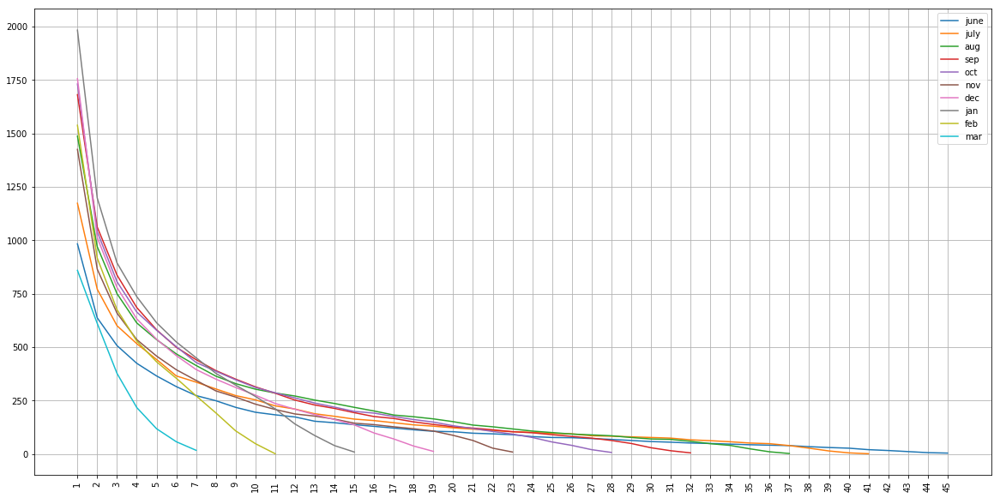

In [0]:
ubeats = df[df['app_apple_id']== ubeats_app_id]

june_points = get_points(ubeats, datetime(2018, 6, 1), datetime(2018, 7, 1))
july_points = get_points(ubeats, datetime(2018, 7, 1), datetime(2018, 8, 1))
aug_points = get_points(ubeats, datetime(2018, 8, 1), datetime(2018, 9, 1))
sep_points = get_points(ubeats, datetime(2018, 9, 1), datetime(2018, 10, 1))
oct_points = get_points(ubeats, datetime(2018, 10, 1), datetime(2018, 11, 1))
nov_points = get_points(ubeats, datetime(2018, 11, 1), datetime(2018, 12, 1))
dec_points = get_points(ubeats, datetime(2018, 12, 1), datetime(2019, 1, 1))
jan_points = get_points(ubeats, datetime(2019, 1, 1), datetime(2019, 2, 1))
feb_points = get_points(ubeats, datetime(2019, 2, 1), datetime(2019, 3, 1))
mar_points = get_points(ubeats, datetime(2019, 3, 1), datetime(2019, 4, 1))

fig, axs = plt.subplots()
axs.plot(june_points[0], june_points[1], label='june')
axs.plot(july_points[0], july_points[1], label='july')
axs.plot(aug_points[0], aug_points[1], label='aug')
axs.plot(sep_points[0], sep_points[1], label='sep')
axs.plot(oct_points[0], oct_points[1], label='oct')
axs.plot(nov_points[0], nov_points[1], label='nov')
axs.plot(dec_points[0], dec_points[1], label='dec')
axs.plot(jan_points[0], jan_points[1], label='jan')
axs.plot(feb_points[0], feb_points[1], label='feb')
axs.plot(mar_points[0], mar_points[1], label='mar')

axs.legend(loc="upper right")

plt.xticks(np.array(june_points[0]).astype(float), rotation='vertical')

axs.grid(True)
plt.show()

## Month subscriptions

In [0]:
month_subscriptions = [
  'Month subscription',
  'Month subscription new',
  'Month subscription with 7 days trial',
]

In [0]:
def get_points(df, start_date, end_date):
  group = df[(df['original_start_date'] >= start_date) & (df['original_start_date'] < end_date)]
  points = [[], []]
  
  for pay_period, data in group[(group['event'].isin(events)) & (group['subscription_name'].isin(month_subscriptions))].groupby('consecutive_paid_periods'):
    points[0].append(pay_period)
    points[1].append(data['quantity'].sum())
  return points

def probability(points):
  result = [[], [], []]
  for i in range(1, len(points[0])):
    result[0].append(points[0][i])
    result[2].append(points[1][i])
    result[1].append(points[1][i] / points[1][i-1])
  return result

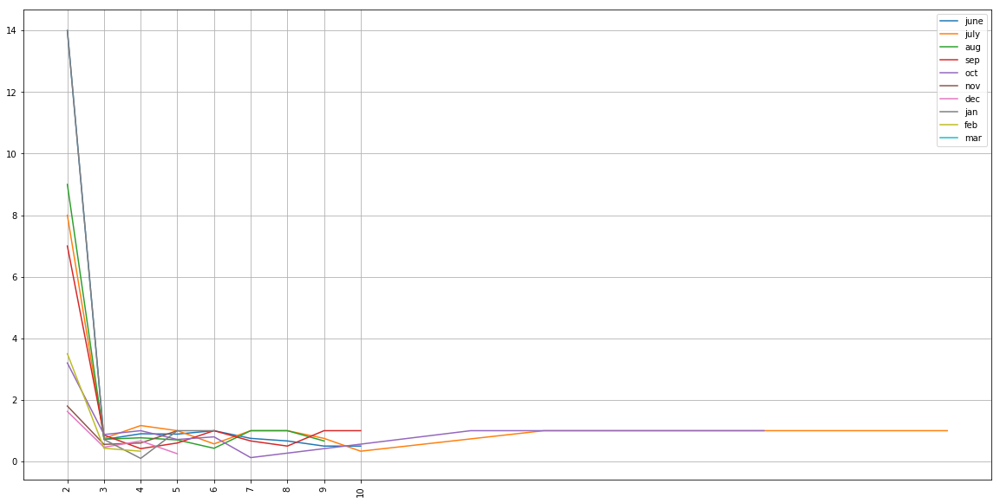

In [0]:
ubeats = df[df['app_apple_id']== ubeats_app_id]

june_points = probability(get_points(ubeats, datetime(2018, 6, 1), datetime(2018, 7, 1)))
july_points = probability(get_points(ubeats, datetime(2018, 7, 1), datetime(2018, 8, 1)))
aug_points = probability(get_points(ubeats, datetime(2018, 8, 1), datetime(2018, 9, 1)))
sep_points = probability(get_points(ubeats, datetime(2018, 9, 1), datetime(2018, 10, 1)))
oct_points = probability(get_points(ubeats, datetime(2018, 10, 1), datetime(2018, 11, 1)))
nov_points = probability(get_points(ubeats, datetime(2018, 11, 1), datetime(2018, 12, 1)))
dec_points = probability(get_points(ubeats, datetime(2018, 12, 1), datetime(2019, 1, 1)))
jan_points = probability(get_points(ubeats, datetime(2019, 1, 1), datetime(2019, 2, 1)))
feb_points = probability(get_points(ubeats, datetime(2019, 2, 1), datetime(2019, 3, 1)))
mar_points = probability(get_points(ubeats, datetime(2019, 3, 1), datetime(2019, 4, 1)))

plt.rcParams['figure.figsize'] = [20, 10]

fig, axs = plt.subplots()
axs.plot(june_points[0], june_points[1], label='june')
axs.plot(july_points[0], july_points[1], label='july')
axs.plot(aug_points[0], aug_points[1], label='aug')
axs.plot(sep_points[0], sep_points[1], label='sep')
axs.plot(oct_points[0], oct_points[1], label='oct')
axs.plot(nov_points[0], nov_points[1], label='nov')
axs.plot(dec_points[0], dec_points[1], label='dec')
axs.plot(jan_points[0], jan_points[1], label='jan')
axs.plot(feb_points[0], feb_points[1], label='feb')
axs.plot(mar_points[0], mar_points[1], label='mar')

axs.legend(loc="upper right")

plt.xticks(np.array(june_points[0]).astype(float), rotation='vertical')

axs.grid(True)

plt.show()

NOTE: monthly subscription is not immediately bought

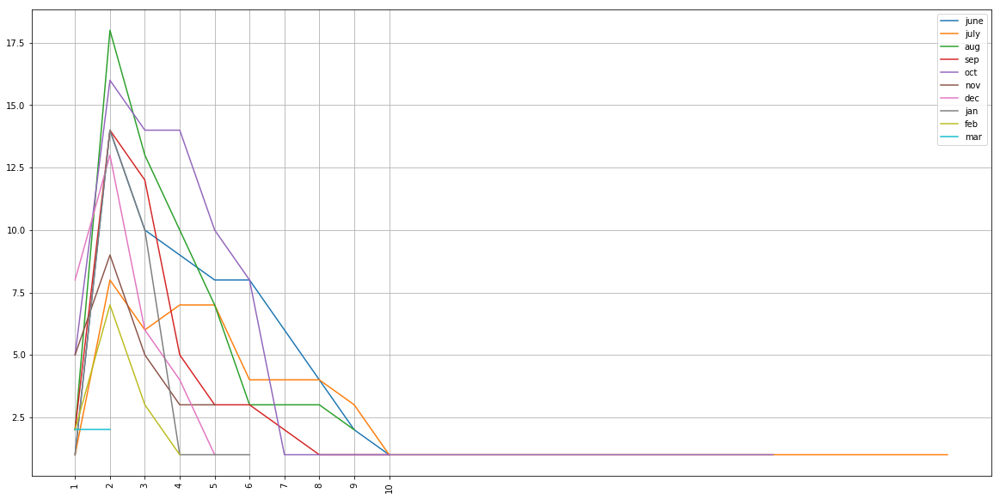

In [0]:
ubeats = df[df['app_apple_id']== ubeats_app_id]

june_points = get_points(ubeats, datetime(2018, 6, 1), datetime(2018, 7, 1))
july_points = get_points(ubeats, datetime(2018, 7, 1), datetime(2018, 8, 1))
aug_points = get_points(ubeats, datetime(2018, 8, 1), datetime(2018, 9, 1))
sep_points = get_points(ubeats, datetime(2018, 9, 1), datetime(2018, 10, 1))
oct_points = get_points(ubeats, datetime(2018, 10, 1), datetime(2018, 11, 1))
nov_points = get_points(ubeats, datetime(2018, 11, 1), datetime(2018, 12, 1))
dec_points = get_points(ubeats, datetime(2018, 12, 1), datetime(2019, 1, 1))
jan_points = get_points(ubeats, datetime(2019, 1, 1), datetime(2019, 2, 1))
feb_points = get_points(ubeats, datetime(2019, 2, 1), datetime(2019, 3, 1))
mar_points = get_points(ubeats, datetime(2019, 3, 1), datetime(2019, 4, 1))
# all_points = get_points(ubeats, datetime(2018, 6, 1), datetime(2019, 4, 1))

fig, axs = plt.subplots()
axs.plot(june_points[0], june_points[1], label='june')
axs.plot(july_points[0], july_points[1], label='july')
axs.plot(aug_points[0], aug_points[1], label='aug')
axs.plot(sep_points[0], sep_points[1], label='sep')
axs.plot(oct_points[0], oct_points[1], label='oct')
axs.plot(nov_points[0], nov_points[1], label='nov')
axs.plot(dec_points[0], dec_points[1], label='dec')
axs.plot(jan_points[0], jan_points[1], label='jan')
axs.plot(feb_points[0], feb_points[1], label='feb')
axs.plot(mar_points[0], mar_points[1], label='mar')
# axs.plot(all_points[0], all_points[1], label='all_points')

axs.legend(loc="upper right")

plt.xticks(np.array(june_points[0]).astype(float), rotation='vertical')

axs.grid(True)
plt.show()

## Year subscriptions

In [0]:
year_subscriptions = [
  'Year subscription',
  'Year subscription new',
]

In [0]:
def get_points(df, start_date, end_date):
  group = df[(df['original_start_date'] >= start_date) & (df['original_start_date'] < end_date)]
  points = [[], []]
  
  for pay_period, data in group[(group['event'].isin(events)) & (group['subscription_name'].isin(year_subscriptions))].groupby('consecutive_paid_periods'):
    points[0].append(pay_period)
    points[1].append(data['quantity'].sum())
  return points

def probability(points):
  result = [[], [], []]
  for i in range(1, len(points[0])):
    result[0].append(points[0][i])
    result[2].append(points[1][i])
    result[1].append(points[1][i] / points[1][i-1])
  return result

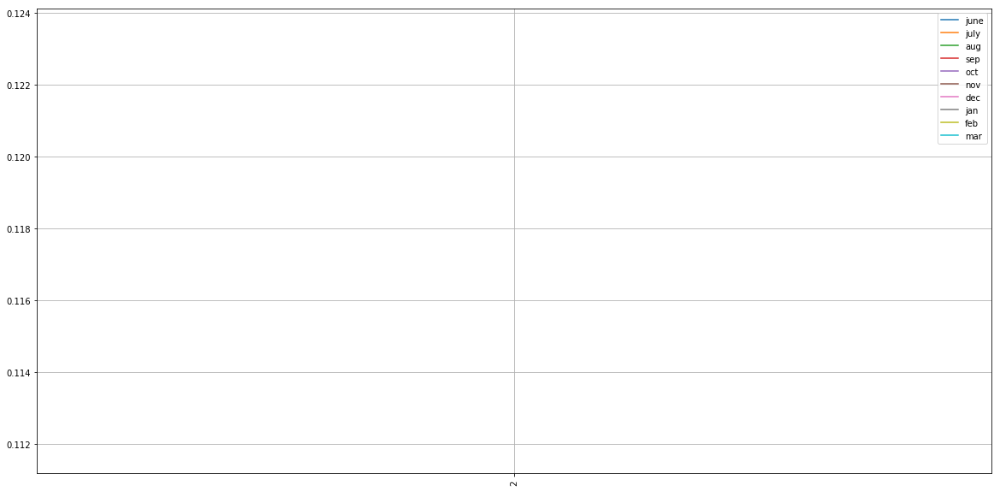

In [0]:
ubeats = df[df['app_apple_id']== ubeats_app_id]

june_points = probability(get_points(ubeats, datetime(2018, 1, 1), datetime(2019, 4, 1)))
july_points = probability(get_points(ubeats, datetime(2018, 7, 1), datetime(2018, 8, 1)))
aug_points = probability(get_points(ubeats, datetime(2018, 8, 1), datetime(2018, 9, 1)))
sep_points = probability(get_points(ubeats, datetime(2018, 9, 1), datetime(2018, 10, 1)))
oct_points = probability(get_points(ubeats, datetime(2018, 10, 1), datetime(2018, 11, 1)))
nov_points = probability(get_points(ubeats, datetime(2018, 11, 1), datetime(2018, 12, 1)))
dec_points = probability(get_points(ubeats, datetime(2018, 12, 1), datetime(2019, 1, 1)))
jan_points = probability(get_points(ubeats, datetime(2019, 1, 1), datetime(2019, 2, 1)))
feb_points = probability(get_points(ubeats, datetime(2019, 2, 1), datetime(2019, 3, 1)))
mar_points = probability(get_points(ubeats, datetime(2019, 3, 1), datetime(2019, 4, 1)))

plt.rcParams['figure.figsize'] = [20, 10]

fig, axs = plt.subplots()
axs.plot(june_points[0], june_points[1], label='june')
axs.plot(july_points[0], july_points[1], label='july')
axs.plot(aug_points[0], aug_points[1], label='aug')
axs.plot(sep_points[0], sep_points[1], label='sep')
axs.plot(oct_points[0], oct_points[1], label='oct')
axs.plot(nov_points[0], nov_points[1], label='nov')
axs.plot(dec_points[0], dec_points[1], label='dec')
axs.plot(jan_points[0], jan_points[1], label='jan')
axs.plot(feb_points[0], feb_points[1], label='feb')
axs.plot(mar_points[0], mar_points[1], label='mar')

axs.legend(loc="upper right")

plt.xticks(np.array(june_points[0]).astype(float), rotation='vertical')

axs.grid(True)

plt.show()

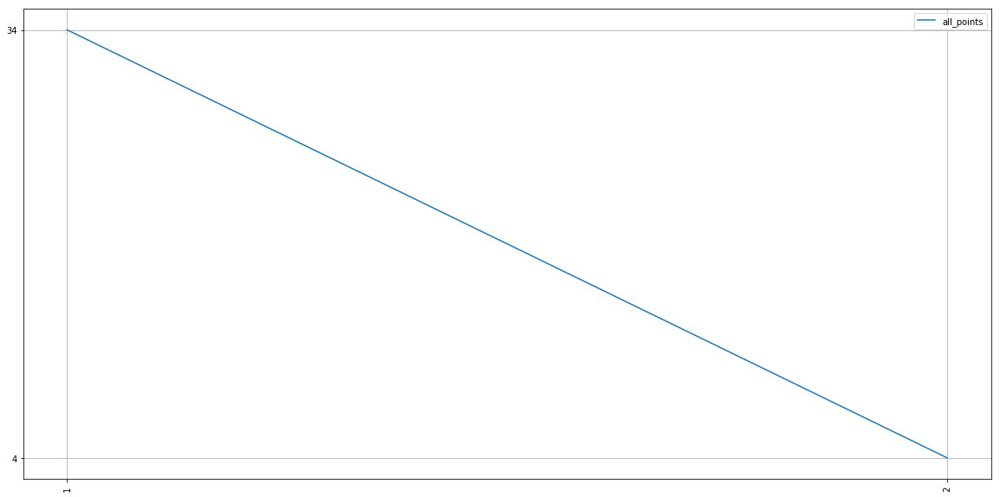

In [0]:
ubeats = df[df['app_apple_id']== ubeats_app_id]

all_points = get_points(ubeats, datetime(2018, 1, 1), datetime(2019, 4, 1))

fig, axs = plt.subplots()

axs.plot(all_points[0], all_points[1], label='all_points')

axs.legend(loc="upper right")

plt.xticks(np.array(all_points[0]).astype(float), rotation='vertical')
plt.yticks(np.array(all_points[1]).astype(float))

axs.grid(True)
plt.show()

haven't enough information to draw conclusions

In [0]:
def get_points(df, start_date, end_date):
  group = df[(df['original_start_date'] >= start_date) & (df['original_start_date'] < end_date)]
  points = [[], []]
  
  for pay_period, data in group[(group['event'].isin(events))].groupby('consecutive_paid_periods'):
    points[0].append(pay_period)
    points[1].append(data['quantity'].sum())
  return points

def probability(points):
  result = [[], [], []]
  for i in range(1, len(points[0])):
    result[0].append(points[0][i])
    result[2].append(points[1][i])
    result[1].append(points[1][i] / points[1][i-1])
  return result

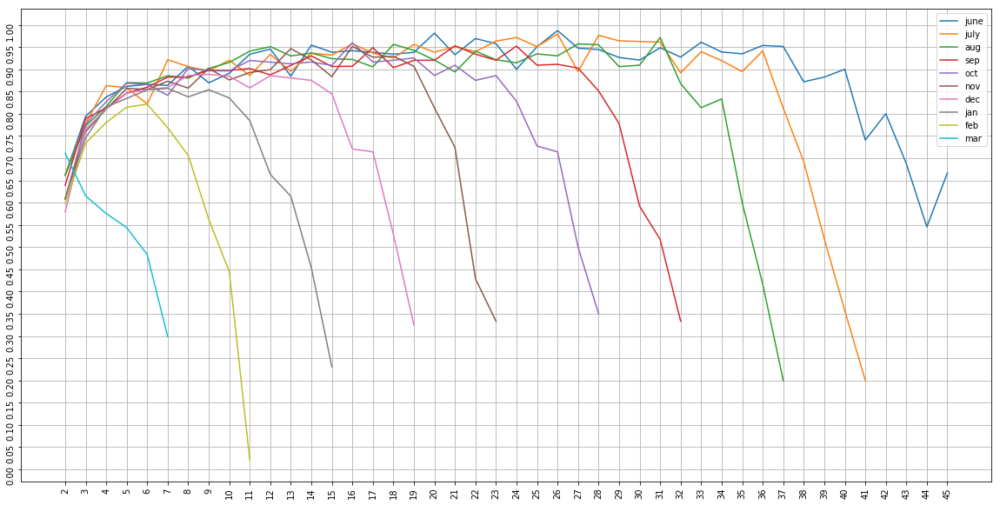

In [0]:
ubeats = df[df['app_apple_id']== ubeats_app_id]

june_points = probability(get_points(ubeats, datetime(2018, 6, 1), datetime(2018, 7, 1)))
july_points = probability(get_points(ubeats, datetime(2018, 7, 1), datetime(2018, 8, 1)))
aug_points = probability(get_points(ubeats, datetime(2018, 8, 1), datetime(2018, 9, 1)))
sep_points = probability(get_points(ubeats, datetime(2018, 9, 1), datetime(2018, 10, 1)))
oct_points = probability(get_points(ubeats, datetime(2018, 10, 1), datetime(2018, 11, 1)))
nov_points = probability(get_points(ubeats, datetime(2018, 11, 1), datetime(2018, 12, 1)))
dec_points = probability(get_points(ubeats, datetime(2018, 12, 1), datetime(2019, 1, 1)))
jan_points = probability(get_points(ubeats, datetime(2019, 1, 1), datetime(2019, 2, 1)))
feb_points = probability(get_points(ubeats, datetime(2019, 2, 1), datetime(2019, 3, 1)))
mar_points = probability(get_points(ubeats, datetime(2019, 3, 1), datetime(2019, 4, 1)))

plt.rcParams['figure.figsize'] = [20, 10]

fig, axs = plt.subplots()
axs.plot(june_points[0], june_points[1], label='june')
axs.plot(july_points[0], july_points[1], label='july')
axs.plot(aug_points[0], aug_points[1], label='aug')
axs.plot(sep_points[0], sep_points[1], label='sep')
axs.plot(oct_points[0], oct_points[1], label='oct')
axs.plot(nov_points[0], nov_points[1], label='nov')
axs.plot(dec_points[0], dec_points[1], label='dec')
axs.plot(jan_points[0], jan_points[1], label='jan')
axs.plot(feb_points[0], feb_points[1], label='feb')
axs.plot(mar_points[0], mar_points[1], label='mar')

axs.legend(loc="upper right")

plt.xticks(np.array(june_points[0]).astype(float), rotation='vertical')
plt.yticks(list(map(lambda x: x/20, range(21))), rotation='vertical')

axs.grid(True)

plt.show()

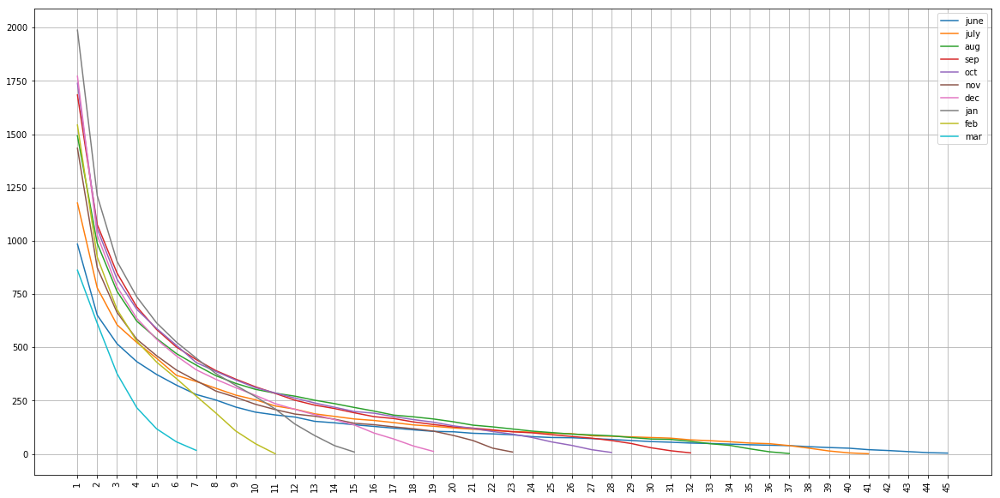

In [0]:
ubeats = df[df['app_apple_id']== ubeats_app_id]

june_points = get_points(ubeats, datetime(2018, 6, 1), datetime(2018, 7, 1))
july_points = get_points(ubeats, datetime(2018, 7, 1), datetime(2018, 8, 1))
aug_points = get_points(ubeats, datetime(2018, 8, 1), datetime(2018, 9, 1))
sep_points = get_points(ubeats, datetime(2018, 9, 1), datetime(2018, 10, 1))
oct_points = get_points(ubeats, datetime(2018, 10, 1), datetime(2018, 11, 1))
nov_points = get_points(ubeats, datetime(2018, 11, 1), datetime(2018, 12, 1))
dec_points = get_points(ubeats, datetime(2018, 12, 1), datetime(2019, 1, 1))
jan_points = get_points(ubeats, datetime(2019, 1, 1), datetime(2019, 2, 1))
feb_points = get_points(ubeats, datetime(2019, 2, 1), datetime(2019, 3, 1))
mar_points = get_points(ubeats, datetime(2019, 3, 1), datetime(2019, 4, 1))

fig, axs = plt.subplots()
axs.plot(june_points[0], june_points[1], label='june')
axs.plot(july_points[0], july_points[1], label='july')
axs.plot(aug_points[0], aug_points[1], label='aug')
axs.plot(sep_points[0], sep_points[1], label='sep')
axs.plot(oct_points[0], oct_points[1], label='oct')
axs.plot(nov_points[0], nov_points[1], label='nov')
axs.plot(dec_points[0], dec_points[1], label='dec')
axs.plot(jan_points[0], jan_points[1], label='jan')
axs.plot(feb_points[0], feb_points[1], label='feb')
axs.plot(mar_points[0], mar_points[1], label='mar')

axs.legend(loc="upper right")

plt.xticks(np.array(june_points[0]).astype(float), rotation='vertical')

axs.grid(True)
plt.show()

regular users - users who paid more than 10 subscriptions.

## Сlassification of payments by country


#### Data normalization

Normalization by trial: 
$$ x = \frac{x_{current}}{x_{start-introductory-price}} $$

Normalization by first payment:

$$ x = \frac{x_{current}}{x_{first-payment}} $$


### Payment

In [0]:
def points_comparator(x):
#   print(x[1])
  return -x[1]

def normalize_dict(current_dict, _dict):
  for key in current_dict.keys():
    
    current_dict[key] = current_dict[key] / _dict[key]
  return current_dict

def normalize(current_data, _data):
  current_dict = {}
  _dict = {}
  for item in current_data:
    current_dict[item[0]] = item[1]
    _dict[item[0]] = item[1]
    
  for item in _data:
    _dict[item[0]] = item[1]
  
  current_dict = normalize_dict(current_dict, _dict)
  print(current_dict)
  return [list(current_dict.keys()), list(current_dict.values())]
  
  
  

In [26]:
group = df[(df['event'] == 'Start Introductory Price')]
ubeats = group[group['app_apple_id']== ubeats_app_id]

start_introductory_price_points = list(map(lambda x: [x[0], x[1]['quantity'].sum()], ubeats.groupby('country')))
start_introductory_price_points = sorted(start_introductory_price_points, key=points_comparator)

trace = go.Pie(labels=list(map(lambda x: x[0], start_introductory_price_points)), values=list(map(lambda x: x[1], start_introductory_price_points)))

configure_plotly_browser_state()
iplot([trace], filename='new-1')

In [27]:
group = df[(df['consecutive_paid_periods'] == 1) & (df['event'].isin(events))]
ubeats = group[group['app_apple_id']== ubeats_app_id]

points = list(map(lambda x: [x[0], x[1]['quantity'].sum()], ubeats.groupby('country')))
points = sorted(points, key=points_comparator)

trace = go.Pie(labels=list(map(lambda x: x[0], points)), values=list(map(lambda x: x[1], points)))

configure_plotly_browser_state()
iplot([trace], filename='3')

In [28]:
group = df[(df['consecutive_paid_periods'] == 10) & (df['event'].isin(events))]
ubeats = group[group['app_apple_id']== ubeats_app_id]

points = list(map(lambda x: [x[0], x[1]['quantity'].sum()], ubeats.groupby('country')))
points = sorted(points, key=points_comparator)
# points = normalize(points, start_introductory_price_points)
# print(points)

trace = go.Pie(labels=list(map(lambda x: x[0], points)), values=list(map(lambda x: x[1], points)))

configure_plotly_browser_state()
iplot([trace], filename='2')

### Payment_2

In [39]:
ubeats = df[(df['app_apple_id']== ubeats_app_id)]
# ubeats_refund = df[(df['app_apple_id']== ubeats_app_id) & (df['event'] == 'Refund')]

groups = ubeats[(ubeats['event'] == 'Start Introductory Price')]

d = {}
for c, group in groups.groupby('country'):
  d[c] = group['quantity'].sum()

trials = pd.Series(d).sort_values(ascending=False)
countries = trials[trials > 0].keys()

trials = trials[countries]
print(trials)

USA    14480
RUS     4810
GBR     4463
AUS     2067
CAN     1630
ITA     1238
DEU     1173
THA     1147
MYS      989
FRA      970
TUR      945
BRA      891
MEX      756
IND      681
KHM      638
ARE      604
CZE      502
JPN      497
NOR      485
IRL      481
ESP      474
UKR      468
SWE      463
BEL      456
CHE      415
PHL      398
ARG      384
NLD      360
CHL      349
HUN      317
       ...  
BWA        7
BEN        7
COG        6
KGZ        5
LBR        5
MOZ        5
VEN        5
TCA        4
BRN        4
FJI        4
GUY        4
CPV        3
MDG        3
UZB        3
BHS        3
GRD        2
KNA        2
TCD        2
LCA        2
BFA        2
SLE        2
MAC        2
MRT        2
BRB        2
BTN        1
LAO        1
ATG        1
PLW        1
VCT        1
VGB        1
Length: 136, dtype: object


In [0]:
ubeats = df[(df['app_apple_id']== ubeats_app_id) & (df['event'].isin(events)) ]
ubeats_refund = df[(df['app_apple_id']== ubeats_app_id) & (df['event'] == 'Refund')]

groups = ubeats[(ubeats['consecutive_paid_periods'] == 1) & (ubeats['event'].isin(events))]
groups_refund = ubeats_refund[(ubeats_refund['consecutive_paid_periods'] == 1)]


d = {}
d_refund = {}

for c, group in groups.groupby('country'):
  d[c] = group['quantity'].sum()

for c, group in groups_refund.groupby('country'):
  d_refund[c] = group['quantity'].sum()
  
  
first_payments = pd.Series(d)[countries].sort_values(ascending=False)
first_payments_refund = pd.Series(d_refund)[countries].sort_values(ascending=False)


In [41]:
ubeats = df[(df['app_apple_id']== ubeats_app_id) & (df['event'].isin(events)) ]
ubeats_refund = df[(df['app_apple_id']== ubeats_app_id) & (df['event'] == 'Refund')]

groups = ubeats[(ubeats['consecutive_paid_periods'] == 8) & (ubeats['event'].isin(events))]
groups_refund = ubeats_refund[(ubeats_refund['consecutive_paid_periods'] == 8)]


d = {}
d_refund = {}

for c, group in groups.groupby('country'):
  d[c] = group['quantity'].sum()

for c, group in groups_refund.groupby('country'):
  d_refund[c] = group['quantity'].sum()
  
  
regular_customers = pd.Series(d)[countries].sort_values(ascending=False).fillna(0)
regular_customers_refund = pd.Series(d_refund)[countries].fillna(0)

print(regular_customers)
print((regular_customers - regular_customers_refund))

USA    1345
GBR     435
AUS     249
FRA     113
CAN     112
JPN      92
BRA      89
ITA      78
NOR      72
SWE      64
DEU      62
RUS      59
ISR      56
IRL      55
CHE      55
ESP      52
ARG      48
IND      45
DNK      44
CZE      37
MEX      34
CHL      33
NLD      33
ZAF      32
TUR      30
ARE      28
AUT      28
MYS      27
IDN      26
BEL      24
       ... 
JOR       0
BHR       0
ARM       0
NIC       0
OMN       0
UGA       0
TUN       0
SEN       0
CYM       0
BEN       0
KGZ       0
VEN       0
FJI       0
GUY       0
CPV       0
MDG       0
BHS       0
GRD       0
KNA       0
TCD       0
LCA       0
BFA       0
SLE       0
MAC       0
MRT       0
BRB       0
BTN       0
ATG       0
PLW       0
VCT       0
Length: 136, dtype: object
AGO       3
ALB       1
ARE      28
ARG      48
ARM       0
ATG       0
AUS     247
AUT      27
AZE       2
BEL      24
BEN       0
BFA       0
BGR       1
BHR       0
BHS       0
BLR       0
BMU       2
BOL       2
BRA      86
BRB       0
B

In [42]:
data = (regular_customers / trials).fillna(0).sort_values(ascending=False)
trace = go.Pie(labels=data.keys(), values=list(data))

configure_plotly_browser_state()
iplot([trace])


In [43]:
data = (regular_customers / trials).fillna(0).sort_values(ascending=False)
data_2 = ((regular_customers - regular_customers_refund) / trials).fillna(0).sort_values(ascending=False)

trace1 = go.Bar(
    x=data.keys(),
    y=data.values,
    name='with refund'
)

trace2 = go.Bar(
    x=data_2.keys(),
    y=data_2.values,
    name='without refund'
)

data = [trace1, trace2]
layout = go.Layout(
    barmode='group'
)

fig = go.Figure(data=data, layout=layout)

configure_plotly_browser_state()
iplot(fig, filename='grouped-bar')

In [44]:
data = (regular_customers / first_payments).fillna(0).sort_values(ascending=False)
trace = go.Pie(labels=data.keys(), values=list(data))

configure_plotly_browser_state()
iplot([trace])

In [45]:
data = (regular_customers / first_payments).fillna(0).sort_values(ascending=False)

# data = (regular_customers / trials).fillna(0).sort_values(ascending=False)

data_2 = ((regular_customers - regular_customers_refund) / first_payments).fillna(0).sort_values(ascending=False)

trace1 = go.Bar(
    x=data.keys(),
    y=data.values,
    name='with refund'
)

trace2 = go.Bar(
    x=data_2.keys(),
    y=data_2.values,
    name='without refund'
)

data = [trace1, trace2]
layout = go.Layout(
    barmode='group'
)

fig = go.Figure(data=data, layout=layout)

configure_plotly_browser_state()
iplot(fig, filename='grouped-bar')

### Payment_3

In [0]:
ubeats = df[(df['app_apple_id']== ubeats_app_id) & (df['event'].isin(events)) ]
ubeats_refund = df[(df['app_apple_id']== ubeats_app_id) & (df['event'] == 'Refund')]

groups = ubeats[(ubeats['consecutive_paid_periods'] == 1) & (ubeats['event'].isin(events))]
groups_refund = ubeats_refund[(ubeats_refund['consecutive_paid_periods'] == 1)]


d = {}
d_refund = {}

for c, group in groups.groupby('country'):
  d[c] = group['quantity'].sum()

for c, group in groups_refund.groupby('country'):
  d_refund[c] = group['quantity'].sum()
  
  
first_payments = pd.Series(d)[countries].sort_values(ascending=False)
first_payments_refund = pd.Series(d_refund)[countries].sort_values(ascending=False)

In [20]:
df[(df['event'].isin(events)) & (df['app_apple_id']== ubeats_app_id)]['consecutive_paid_periods'].value_counts()

1     15416
2     10469
3      8152
4      6734
5      5704
6      4911
7      4278
8      3758
9      3316
10     2926
11     2588
12     2310
13     2071
14     1869
15     1680
16     1541
17     1398
18     1277
19     1176
20     1077
21      978
22      895
23      814
24      738
25      679
26      631
27      579
28      532
29      485
30      439
      ...  
32      364
33      336
34      314
35      283
36      254
37      225
38      202
39      174
40      151
41      133
42      114
43      104
44       93
45       84
46       79
47       71
48       60
49       51
50       48
51       42
52       33
53       25
54       16
55       12
56       12
57        8
58        6
59        5
60        2
61        1
Name: consecutive_paid_periods, Length: 61, dtype: int64

In [21]:
data = []

ubeats = df[(df['app_apple_id']== ubeats_app_id) & (df['event'].isin(events)) ]


trials = df[df['event'] == 'Start Introductory Price']['quantity'].sum()
values = [1, ]
for j in range(1, 30):
  count_2 = ubeats[(ubeats['consecutive_paid_periods'] == j)]['quantity'].sum()
  values.append(count_2 / trials)
data.append(go.Scatter(x = list(range(len(values))), y = values, name='trials'))


for i in range(1, 15):
  count = ubeats[(ubeats['consecutive_paid_periods'] == i)]['quantity'].sum()
  values = []
  for j in range(i, 30):
    count_2 = ubeats[(ubeats['consecutive_paid_periods'] == j)]['quantity'].sum()
    values.append(count_2 / count)
   
  data.append(go.Scatter(x = list(range(len(values))), y = values, name='{0}'.format(i)))
  
fig = go.Figure(data=data)
  
configure_plotly_browser_state()
iplot(fig)



In [23]:
# without Refunds

data = []

ubeats = df[(df['app_apple_id']== ubeats_app_id) & (df['event'].isin(events)) ]
ubeats_refund = df[(df['app_apple_id']== ubeats_app_id) & (df['event'] == 'Refund')]


trials = df[df['event'] == 'Start Introductory Price']['quantity'].sum()
values = [1, ]
for j in range(1, 30):
  count_2 = ubeats[(ubeats['consecutive_paid_periods'] == j)]['quantity'].sum()
  refund = ubeats_refund[(ubeats_refund['consecutive_paid_periods'] == j)]['quantity'].sum()
  values.append((count_2 - refund) / trials)
data.append(go.Scatter(x = list(range(len(values))), y = values, name='trials'))


for i in range(1, 15):
  count = ubeats[(ubeats['consecutive_paid_periods'] == i)]['quantity'].sum()
  count_refund = ubeats_refund[(ubeats_refund['consecutive_paid_periods'] == i)]['quantity'].sum()
  values = []
  for j in range(i, 30):
    count_2 = ubeats[(ubeats['consecutive_paid_periods'] == j)]['quantity'].sum()
    refund = ubeats_refund[(ubeats_refund['consecutive_paid_periods'] == j)]['quantity'].sum()
    
    values.append((count_2 - refund) / (count - count_refund))
   
  data.append(go.Scatter(x = list(range(len(values))), y = values, name='{0}'.format(i)))
  
fig = go.Figure(data=data)
  
configure_plotly_browser_state()
iplot(fig)

In [32]:
# without Refunds

month_subscriptions = [
  'Month subscription',
  'Month subscription new',
  'Month subscription with 7 days trial',
]

data = []

ubeats = df[(df['app_apple_id']== ubeats_app_id) & (df['event'].isin(month_subscriptions)) ]
ubeats_refund = df[(df['app_apple_id']== ubeats_app_id) & (df['event'] == 'Refund')]


trials = df[df['event'] == 'Start Introductory Price']['quantity'].sum()
values = [1, ]
for j in range(1, 30):
  count_2 = ubeats[(ubeats['consecutive_paid_periods'] == j)]['quantity'].sum()
  refund = ubeats_refund[(ubeats_refund['consecutive_paid_periods'] == j)]['quantity'].sum()
  values.append((count_2 - refund) / trials)
data.append(go.Scatter(x = list(range(len(values))), y = values, name='trials'))


for i in range(1, 15):
  count = ubeats[(ubeats['consecutive_paid_periods'] == i)]['quantity'].sum()
  count_refund = ubeats_refund[(ubeats_refund['consecutive_paid_periods'] == i)]['quantity'].sum()
  values = []
  for j in range(i, 30):
    count_2 = ubeats[(ubeats['consecutive_paid_periods'] == j)]['quantity'].sum()
    refund = ubeats_refund[(ubeats_refund['consecutive_paid_periods'] == j)]['quantity'].sum()
    
    values.append((count_2 - refund) / (count - count_refund))
   
  data.append(go.Scatter(x = list(range(len(values))), y = values, name='{0}'.format(i)))
  
layout=go.Layout(title="Month")
fig = go.Figure(data=data, layout=layout)
  
configure_plotly_browser_state()
iplot(fig)

In [246]:
trials = df[df['event'] == 'Start Introductory Price']['quantity'].sum()

def calc(N):
  _sum = [0,0,1]
  index = 1
 
  while index * N > 5:
    count_2 = ubeats[(ubeats['consecutive_paid_periods'] == _sum[2])]['quantity'].sum()
    refund = ubeats_refund[(ubeats_refund['consecutive_paid_periods'] == _sum[2])]['quantity'].sum()
    index = (count_2 - refund) / trials

    if _sum[2] < 4:
      _sum[0] += index * N
    else:
      _sum[1] += index * N
    _sum[2] += 1
  return _sum


print(calc(1000))

[Decimal('58.88530492836246343110044257'), Decimal('66.36786437626584652314154978'), 13]


### Cancellations


In [90]:
ubeats_refund = df[(df['app_apple_id']== ubeats_app_id) & (df['event'] == 'Refund')]

d_refund = {}

for c, group in ubeats_refund.groupby('country'):
  d_refund[c] = group['quantity'].sum()
  
refunds = pd.Series(d_refund)[countries].sort_values(ascending=False)

print(refunds)

USA    563
GBR    156
CAN     52
AUS     49
RUS     47
TUR     30
IND     24
BRA     13
DEU     12
MEX     11
FRA     11
ARE     11
ITA     11
CZE      8
THA      7
MYS      6
KHM      1
dtype: object


In [17]:
group = df[(df['consecutive_paid_periods'] == 13) & (df['event'] == 'Cancel')]
ubeats = group[group['app_apple_id']== ubeats_app_id]

points = list(map(lambda x: [x[0], x[1]['quantity'].sum()], ubeats.groupby('country')))
points = sorted(points, key=points_comparator)

trace = go.Pie(labels=list(map(lambda x: x[0], points)), values=list(map(lambda x: x[1], points)))

configure_plotly_browser_state()
iplot([trace], filename='1')

NameError: ignored

In [0]:
group = df[(df['consecutive_paid_periods'] == 1) & (df['event'] == 'Cancel')]
ubeats = group[group['app_apple_id']== ubeats_app_id]

points = list(map(lambda x: [x[0], x[1]['quantity'].sum()], ubeats.groupby('country')))
points = sorted(points, key=points_comparator)

trace = go.Pie(labels=list(map(lambda x: x[0], points)), values=list(map(lambda x: x[1], points)))

configure_plotly_browser_state()
iplot([trace], filename='1')

In [0]:
group = df[(df['consecutive_paid_periods'] == 0) & (df['event'] == 'Cancel')]
ubeats = group[group['app_apple_id']== ubeats_app_id]

points = list(map(lambda x: [x[0], x[1]['quantity'].sum()], ubeats.groupby('country')))
points = sorted(points, key=points_comparator)

trace = go.Pie(labels=list(map(lambda x: x[0], points)), values=list(map(lambda x: x[1], points)))

configure_plotly_browser_state()
iplot([trace], filename='1')

### Alive users

#### march

$$ alive = (Start Introductory Price + Start Introductory Offer + Reactivate + Reactivate with Crossgrade + Reactivate with Introductory Price) - (Cancel) $$

In [0]:
mar_ubeats = df[(df['app_apple_id']== ubeats_app_id) & (df['original_start_date'] > datetime(2018, 3, 1)) & (df['original_start_date'] < datetime(2018, 4, 1))]
apr_ubeats = df[(df['app_apple_id']== ubeats_app_id) & (df['original_start_date'] > datetime(2018, 4, 1)) & (df['original_start_date'] < datetime(2018, 5, 1))]
may_ubeats = df[(df['app_apple_id']== ubeats_app_id) & (df['original_start_date'] > datetime(2018, 5, 1)) & (df['original_start_date'] < datetime(2018, 6, 1))]
june_ubeats = df[(df['app_apple_id']== ubeats_app_id) & (df['original_start_date'] > datetime(2018, 6, 1)) & (df['original_start_date'] < datetime(2018, 7, 1))]
july_ubeats = df[(df['app_apple_id']== ubeats_app_id) & (df['original_start_date'] > datetime(2018, 7, 1)) & (df['original_start_date'] < datetime(2018, 8, 1))]
aug_ubeats = df[(df['app_apple_id']== ubeats_app_id) & (df['original_start_date'] > datetime(2018, 8, 1)) & (df['original_start_date'] < datetime(2018, 9, 1))]
sep_ubeats = df[(df['app_apple_id']== ubeats_app_id) & (df['original_start_date'] > datetime(2018, 9, 1)) & (df['original_start_date'] < datetime(2018, 10, 1))]
oct_ubeats = df[(df['app_apple_id']== ubeats_app_id) & (df['original_start_date'] > datetime(2018, 10, 1)) & (df['original_start_date'] < datetime(2018, 11, 1))]
nov_ubeats = df[(df['app_apple_id']== ubeats_app_id) & (df['original_start_date'] > datetime(2018, 11, 1)) & (df['original_start_date'] < datetime(2018, 12, 1))]
dec_ubeats = df[(df['app_apple_id']== ubeats_app_id) & (df['original_start_date'] > datetime(2019, 12, 1)) & (df['original_start_date'] < datetime(2019, 1, 1))]
jan_ubeats = df[(df['app_apple_id']== ubeats_app_id) & (df['original_start_date'] > datetime(2019, 1, 1)) & (df['original_start_date'] < datetime(2019, 2, 1))]
feb_ubeats = df[(df['app_apple_id']== ubeats_app_id) & (df['original_start_date'] > datetime(2019, 2, 1)) & (df['original_start_date'] < datetime(2019, 3, 1))]
mar_ubeats_2 = df[(df['app_apple_id']== ubeats_app_id) & (df['original_start_date'] > datetime(2019, 3, 25)) & (df['original_start_date'] < datetime(2019, 4, 5))]
apr_ubeats_2 = df[(df['app_apple_id']== ubeats_app_id) & (df['original_start_date'] > datetime(2019, 4, 1)) & (df['original_start_date'] < datetime(2019, 5, 1))]

In [0]:
def getAliveCount(df):
  alive = ( 
              df[(df['event'] == "Start Introductory Price")].shape[0] +
              df[(df['event'] == "Start Introductory Offer")].shape[0] +
              df[(df['event'] == "Reactivate")].shape[0] + 
              df[(df['event'] == "Reactivate with Crossgrade")].shape[0] +
              df[(df['event'] == "Reactivate with Introductory Price")].shape[0]
          ) - (
              df[(df['event'] == "Cancel")].shape[0]
          )
  return alive

In [188]:
print('mar_ubeats', getAliveCount(mar_ubeats))
print('apr_ubeats', getAliveCount(apr_ubeats))
print('may_ubeats', getAliveCount(may_ubeats))
print('june_ubeats', getAliveCount(june_ubeats))
print('july_ubeats', getAliveCount(july_ubeats))
print('aug_ubeats', getAliveCount(aug_ubeats))
print('sep_ubeats', getAliveCount(sep_ubeats))
print('oct_ubeats', getAliveCount(oct_ubeats))
print('nov_ubeats', getAliveCount(nov_ubeats))
print('dec_ubeats', getAliveCount(dec_ubeats))
print('jan_ubeats', getAliveCount(jan_ubeats))
print('feb_ubeats', getAliveCount(feb_ubeats))
print('mar_ubeats_2', getAliveCount(mar_ubeats_2))
print('apr_ubeats_2', getAliveCount(apr_ubeats_2))


mar_ubeats -113
apr_ubeats 21
may_ubeats 92
june_ubeats 222
july_ubeats 259
aug_ubeats 279
sep_ubeats 559
oct_ubeats 579
nov_ubeats 590
dec_ubeats 0
jan_ubeats 270
feb_ubeats 613
mar_ubeats_2 205
apr_ubeats_2 567


In [0]:
# print(apr_ubeats_2[(apr_ubeats_2['event'] == "Start Introductory Price")].shape[0])
# print(apr_ubeats_2[(apr_ubeats_2['event'] == "Reactivate")].shape[0])
# print(apr_ubeats_2[(apr_ubeats_2['event'] == "Reactivate with Crossgrade")].shape[0])
# print(apr_ubeats_2[(apr_ubeats_2['event'] == "Reactivate with Introductory Price")].shape[0])
# print(apr_ubeats_2[(apr_ubeats_2['event'] == "Cancel")].shape[0])
# print(apr_ubeats_2[(apr_ubeats_2['event'] == "Cancelled from Billing Retry")].shape[0])

In [174]:
df[(df['app_apple_id']== ubeats_app_id) & (df['original_start_date'] > datetime(2019, 2, 1)) & (df['original_start_date'] < datetime(2019, 3, 1))]['event'].value_counts()

Renew                                         3045
Start Introductory Price                      2692
Cancel                                        2227
Billing Retry from Introductory Price         1408
Renewal from Billing Retry                     993
Cancelled from Billing Retry                   971
Billing Retry from Paid Subscription           910
Paid Subscription from Introductory Price      748
Reactivate                                     123
Introductory Price from Introductory Price     104
Refund                                          95
Subscribe                                       30
Reactivate with Crossgrade                      25
Crossgrade                                      10
Crossgrade from Billing Retry                    5
Crossgrade from Introductory Price               5
Name: event, dtype: int64

In [173]:
df[(df['app_apple_id']== ubeats_app_id) & (df['original_start_date'] > datetime(2019, 3, 1)) & (df['original_start_date'] < datetime(2019, 4, 1))]['event'].value_counts()

Start Introductory Price                      1618
Cancel                                        1545
Renew                                         1302
Billing Retry from Introductory Price          684
Start Introductory Offer                       459
Renewal from Billing Retry                     433
Billing Retry from Paid Subscription           416
Paid Subscription from Introductory Price      377
Billing Retry from Introductory Offer          303
Paid Subscription from Introductory Offer      219
Cancelled from Billing Retry                   181
Reactivate                                     123
Introductory Price from Introductory Price      61
Refund                                          53
Subscribe                                       21
Reactivate with Crossgrade                      19
Crossgrade                                       6
Name: event, dtype: int64

In [172]:
df[(df['app_apple_id']== ubeats_app_id) & (df['original_start_date'] > datetime(2019, 4, 1)) & (df['original_start_date'] < datetime(2019, 5, 1))]['event'].value_counts()

Start Introductory Offer                      1110
Cancel                                         622
Billing Retry from Introductory Offer          361
Paid Subscription from Introductory Offer      268
Renew                                          166
Reactivate                                      73
Renewal from Billing Retry                      72
Cancelled from Billing Retry                    52
Introductory Price from Introductory Price      47
Billing Retry from Paid Subscription            47
Subscribe                                       14
Refund                                          11
Reactivate with Crossgrade                       6
Crossgrade from Introductory Offer               3
Name: event, dtype: int64

In [0]:
print(ubeats[(ubeats['event'] == "Start Introductory Price")].shape[0])
print(ubeats[(ubeats['event'] == "Reactivate")].shape[0])
print(ubeats[(ubeats['event'] == "Reactivate with Crossgrade")].shape[0])
print(ubeats[(ubeats['event'] == "Reactivate with Introductory Price")].shape[0])
print(ubeats[(ubeats['event'] == "Cancel")].shape[0])
print(ubeats[(ubeats['event'] == "Cancelled from Billing Retry")].shape[0])

## Time analysis

### 1

In [0]:
def calc(df):
  return df[df['event'] == "Refund"]['quantity'].sum() / df[df['event'].isin(events)]['quantity'].sum()

In [18]:
calc(df)

Decimal('0.01291813062521056937960244501')

In [19]:
date = datetime(2018, 3, 1)
td = timedelta(7)
arr = [[], []]

while date < datetime(2019, 4, 9):
  arr[0].append(calc(df[(df['original_start_date'] > date) & (df['original_start_date'] < (date + td) )]))
  arr[1].append(date)
  date += td
    
data = [] 

layout=go.Layout(title="Refund / Payment")
data.append(go.Scatter(x = arr[1], y = arr[0]))
fig = go.Figure(data=data, layout=layout)

configure_plotly_browser_state()
iplot(fig)

print('mean = ', np.mean(arr[0]))


# print(calc(df[(df['original_start_date'] > datetime(2018, 3, 1)) & (df['original_start_date'] < datetime(2018, 4, 1))]))
# print(calc(df[(df['original_start_date'] > datetime(2018, 4, 1)) & (df['original_start_date'] < datetime(2018, 5, 1))]))
# print(calc(df[(df['original_start_date'] > datetime(2018, 5, 1)) & (df['original_start_date'] < datetime(2018, 6, 1))]))
# print(calc(df[(df['original_start_date'] > datetime(2018, 6, 1)) & (df['original_start_date'] < datetime(2018, 7, 1))]))
# print(calc(df[(df['original_start_date'] > datetime(2018, 7, 1)) & (df['original_start_date'] < datetime(2018, 8, 1))]))
# print(calc(df[(df['original_start_date'] > datetime(2018, 8, 1)) & (df['original_start_date'] < datetime(2018, 9, 1))]))
# print(calc(df[(df['original_start_date'] > datetime(2018, 9, 1)) & (df['original_start_date'] < datetime(2018, 10, 1))]))
# print(calc(df[(df['original_start_date'] > datetime(2018, 10, 1)) & (df['original_start_date'] < datetime(2018, 11, 1))]))
# print(calc(df[(df['original_start_date'] > datetime(2018, 11, 1)) & (df['original_start_date'] < datetime(2018, 12, 1))]))
# print(calc(df[(df['original_start_date'] > datetime(2018, 12, 1)) & (df['original_start_date'] < datetime(2019, 1, 1))]))
# print(calc(df[(df['original_start_date'] > datetime(2019, 1, 1)) & (df['original_start_date'] < datetime(2019, 2, 1))]))
# print(calc(df[(df['original_start_date'] > datetime(2019, 2, 1)) & (df['original_start_date'] < datetime(2019, 3, 1))]))
# print(calc(df[(df['original_start_date'] > datetime(2019, 3, 1)) & (df['original_start_date'] < datetime(2019, 4, 1))]))
# print(calc(df[(df['original_start_date'] > datetime(2019, 4, 1)) & (df['original_start_date'] < datetime(2019, 5, 1))]))


mean =  0.0139012131510097844074654969


## 2

# 0

In [0]:
df[(df['event'] == 'Refund')].T

,476,477,478,479,480,481,1155,1156,1157,1158,...,200500,200501,200502,200503,200504,200505,200506,200507,200508,210658
event_date,2018-10-20 00:00:00,2018-06-05 00:00:00,2018-07-30 00:00:00,2018-05-10 00:00:00,2019-01-12 00:00:00,2018-08-24 00:00:00,2018-04-11 00:00:00,2018-06-06 00:00:00,2018-04-30 00:00:00,2018-04-21 00:00:00,...,2019-03-05 00:00:00,2019-02-28 00:00:00,2019-02-25 00:00:00,2019-03-14 00:00:00,2019-02-01 00:00:00,2019-04-07 00:00:00,2019-04-05 00:00:00,2019-04-02 00:00:00,2019-03-27 00:00:00,2019-01-29 00:00:00
event,Refund,Refund,Refund,Refund,Refund,Refund,Refund,Refund,Refund,Refund,...,Refund,Refund,Refund,Refund,Refund,Refund,Refund,Refund,Refund,Refund
app_name,U Beats: Beat Maker & Drum Pad,U Beats: Beat Maker & Drum Pad,U Beats: Beat Maker & Drum Pad,U Beats: Beat Maker & Drum Pad,U Beats: Beat Maker & Drum Pad,U Beats: Beat Maker & Drum Pad,U Beats: Beat Maker & Drum Pad,U Beats: Beat Maker & Drum Pad,U Beats: Beat Maker & Drum Pad,U Beats: Beat Maker & Drum Pad,...,U Beats: Beat Maker & Drum Pad,U Beats: Beat Maker & Drum Pad,U Beats: Beat Maker & Drum Pad,U Beats: Beat Maker & Drum Pad,U Beats: Beat Maker & Drum Pad,U Beats: Beat Maker & Drum Pad,U Beats: Beat Maker & Drum Pad,U Beats: Beat Maker & Drum Pad,U Beats: Beat Maker & Drum Pad,U Beats: Beat Maker & Drum Pad
app_apple_id,1238153568,1238153568,1238153568,1238153568,1238153568,1238153568,1238153568,1238153568,1238153568,1238153568,...,1238153568,1238153568,1238153568,1238153568,1238153568,1238153568,1238153568,1238153568,1238153568,1238153568
subscription_name,Month subscription with 7 days trial,Month subscription with 7 days trial,Month subscription with 7 days trial,Month subscription with 7 days trial,Month subscription with 7 days trial,Month subscription with 7 days trial,Month subscription,Month subscription,Month subscription,Month subscription,...,Weekly subscription with 3-day trial by 8.99,Weekly subscription with 3-day trial by 8.99,Weekly subscription with 3-day trial by 8.99,Weekly subscription with 3-day trial by 8.99,Weekly subscription with 3-day trial by 8.99,Weekly subscription with 3-day trial by 8.99,Weekly subscription with 3-day trial by 8.99,Weekly subscription with 3-day trial by 8.99,Weekly subscription with 3-day trial by 8.99,Week subscription with 3 days trial by 0.99
subscription_apple_id,1262732920,1262732920,1262732920,1262732920,1262732920,1262732920,1262734122,1262734122,1262734122,1262734122,...,1443526453,1443526453,1443526453,1443526453,1443526453,1443526453,1443526453,1443526453,1443526453,1447405911
subscription_group_id,20403689,20403689,20403689,20403689,20403689,20403689,20403689,20403689,20403689,20403689,...,20450526,20450526,20450526,20450526,20450526,20450526,20450526,20450526,20450526,20403689
subscription_duration,1 Month,1 Month,1 Month,1 Month,1 Month,1 Month,1 Month,1 Month,1 Month,1 Month,...,7 Days,7 Days,7 Days,7 Days,7 Days,7 Days,7 Days,7 Days,7 Days,7 Days
introductory_price_type,None,None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
introductory_price_duration,None,None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None


In [0]:
d = datetime.strptime('2018-01-19 00:00:00', "%Y-%m-%d %H:%M:%S")

In [0]:
df[(df['event'] == 'Refund') & (df['original_start_date'] == d)].T

,476,1158
event_date,2018-10-20 00:00:00,2018-04-21 00:00:00
event,Refund,Refund
app_name,U Beats: Beat Maker & Drum Pad,U Beats: Beat Maker & Drum Pad
app_apple_id,1238153568,1238153568
subscription_name,Month subscription with 7 days trial,Month subscription
subscription_apple_id,1262732920,1262734122
subscription_group_id,20403689,20403689
subscription_duration,1 Month,1 Month
introductory_price_type,None,None
introductory_price_duration,None,None
